### GEO 398D-1 Machine Learning in Geosciences Project

>> GOAL: To predict carbon emission in Rwanda

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.preprocessing import StandardScaler


import warnings
warnings.filterwarnings('ignore')

## Import Data (Training Dataset)

In [2]:
train_data = pd.read_csv('train.csv')

In [3]:
train_data_copy = train_data.copy()

In [4]:
train_data_copy.head().T

,0,1,2,3,4
ID_LAT_LON_YEAR_WEEK,ID_-0.510_29.290_2019_00,ID_-0.510_29.290_2019_01,ID_-0.510_29.290_2019_02,ID_-0.510_29.290_2019_03,ID_-0.510_29.290_2019_04
latitude,-0.51,-0.51,-0.51,-0.51,-0.51
longitude,29.29,29.29,29.29,29.29,29.29
year,2019,2019,2019,2019,2019
week_no,0,1,2,3,4
...,...,...,...,...,...
Cloud_sensor_azimuth_angle,-12.628986,30.359375,15.377883,-11.293399,38.532263
Cloud_sensor_zenith_angle,35.632416,39.557633,30.401823,24.380357,37.392979
Cloud_solar_azimuth_angle,-138.786423,-145.18393,-142.519545,-132.665828,-141.509805
Cloud_solar_zenith_angle,30.75214,27.251779,26.193296,28.829155,22.204612


In [5]:
train_data.describe()

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
count,79023.000000,79023.000000,79023.000000,79023.000000,64414.000000,64414.000000,64414.000000,64414.000000,64414.000000,64414.000000,...,78539.000000,78539.000000,78539.000000,78539.000000,78539.000000,78539.000000,78539.000000,78539.000000,78539.000000,79023.000000
mean,-1.891072,29.880155,2020.000000,26.000000,0.000048,0.834848,0.000035,0.158418,-7.925870,37.436189,...,5592.377478,59420.297456,4670.430869,19.139241,0.271460,-10.784832,40.436976,-86.800583,27.925981,81.940552
std,0.694522,0.810375,0.816502,15.297155,0.000272,0.185382,0.000206,0.071364,64.263368,14.149950,...,1428.503002,9051.163609,1359.251583,13.547047,0.049434,30.374462,6.428216,37.837269,4.403835,144.299648
min,-3.299000,28.228000,2019.000000,0.000000,-0.000996,0.241822,-0.000887,0.000000,-179.537059,0.099237,...,1050.661782,24779.033704,1050.496816,1.844529,0.017697,-102.739731,2.998873,-153.464211,10.818288,0.000000
25%,-2.451000,29.262000,2019.000000,13.000000,-0.000096,0.705817,-0.000078,0.110535,-56.782383,28.844520,...,4595.400519,53175.779928,3680.856344,9.974574,0.241453,-30.309170,35.829907,-125.991158,24.686763,9.797995
50%,-1.882000,29.883000,2020.000000,26.000000,0.000024,0.809118,0.000019,0.161855,-12.441726,37.784299,...,5573.854309,59332.532548,4621.755170,15.130688,0.272747,-12.673914,41.119630,-84.644352,28.333630,45.593445
75%,-1.303000,30.471000,2021.000000,39.000000,0.000153,0.942792,0.000121,0.211824,72.059990,47.634875,...,6542.303642,65663.842684,5572.983223,23.785030,0.302892,9.402202,44.446272,-48.132701,31.499883,109.549595
max,-0.510000,31.532000,2021.000000,52.000000,0.004191,1.885239,0.004236,0.299998,122.095200,66.242012,...,12384.239458,89291.615576,11384.239458,250.000000,0.736514,78.223037,65.951248,-22.653170,42.060436,3167.768000


In [6]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79023 entries, 0 to 79022
Data columns (total 76 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   ID_LAT_LON_YEAR_WEEK                                      79023 non-null  object 
 1   latitude                                                  79023 non-null  float64
 2   longitude                                                 79023 non-null  float64
 3   year                                                      79023 non-null  int64  
 4   week_no                                                   79023 non-null  int64  
 5   SulphurDioxide_SO2_column_number_density                  64414 non-null  float64
 6   SulphurDioxide_SO2_column_number_density_amf              64414 non-null  float64
 7   SulphurDioxide_SO2_slant_column_number_density            64414 non-null  float64
 8   SulphurDioxide_c

In [7]:
train_data.shape, train_data.size

((79023, 76), 6005748)

## EXPLORATORY DATA ANALYSIS

In [8]:
train_data.isna().sum()  # check for missing values

ID_LAT_LON_YEAR_WEEK            0
latitude                        0
longitude                       0
year                            0
week_no                         0
                             ... 
Cloud_sensor_azimuth_angle    484
Cloud_sensor_zenith_angle     484
Cloud_solar_azimuth_angle     484
Cloud_solar_zenith_angle      484
emission                        0
Length: 76, dtype: int64

In [9]:
import missingno as msno # We used missigno to visualize missing data

<Axes: >

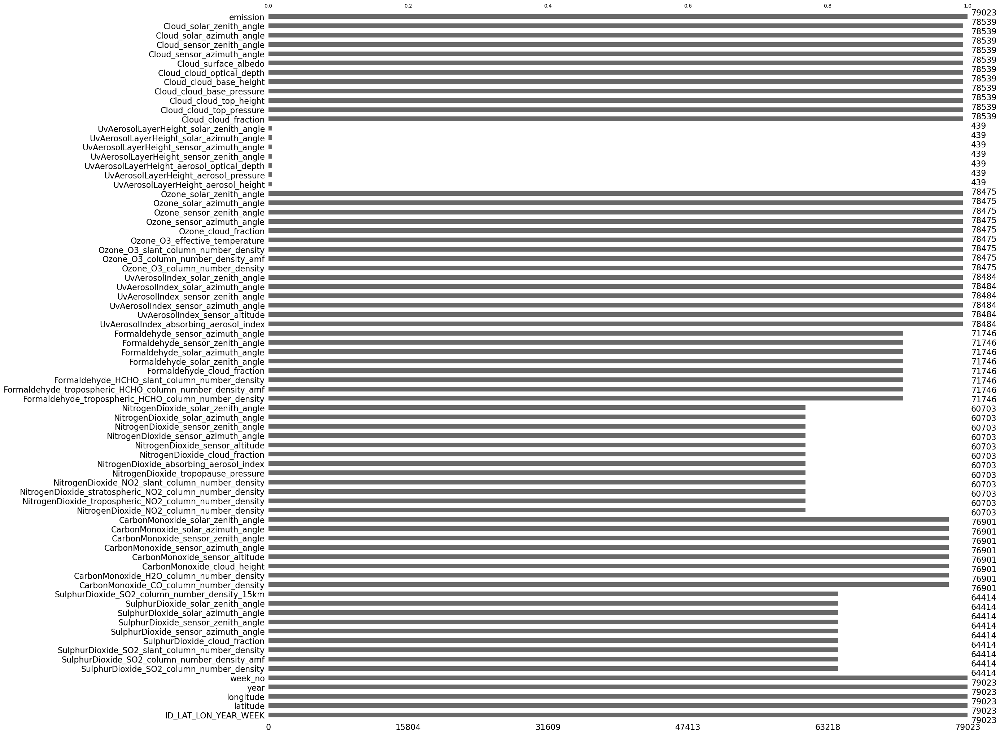

In [10]:
msno.bar(train_data)

In [11]:
# convert missing data info. into a dataframe
missing_data = train_data.isna().sum()
missing_data = pd.DataFrame({'Missing_Count': missing_data}, index=missing_data.index)
missing_data.head(10)

,Missing_Count
ID_LAT_LON_YEAR_WEEK,0
latitude,0
longitude,0
year,0
week_no,0
SulphurDioxide_SO2_column_number_density,14609
SulphurDioxide_SO2_column_number_density_amf,14609
SulphurDioxide_SO2_slant_column_number_density,14609
SulphurDioxide_cloud_fraction,14609
SulphurDioxide_sensor_azimuth_angle,14609


In [12]:
#Remove columns with very high missing values > 70000
train_data.drop(list(missing_data.loc[missing_data['Missing_Count']>70000].index), axis = 1, inplace=True)
train_data.drop(columns='ID_LAT_LON_YEAR_WEEK',axis=1, inplace=True)
train_data_copy.drop(columns='ID_LAT_LON_YEAR_WEEK',axis=1, inplace=True)

In [13]:
# Check the shape of the original training dataframe and the 
# treated dataframe that we've dropped certain columns with very high missing values > 80%
train_data.shape, train_data_copy.shape

((79023, 68), (79023, 75))

## NOTE: 7 columns dropped

In [14]:
dropped_cols = missing_data.loc[missing_data['Missing_Count'] > 70000].index
dropped_cols

Index(['UvAerosolLayerHeight_aerosol_height',
       'UvAerosolLayerHeight_aerosol_pressure',
       'UvAerosolLayerHeight_aerosol_optical_depth',
       'UvAerosolLayerHeight_sensor_zenith_angle',
       'UvAerosolLayerHeight_sensor_azimuth_angle',
       'UvAerosolLayerHeight_solar_azimuth_angle',
       'UvAerosolLayerHeight_solar_zenith_angle'],
      dtype='object')

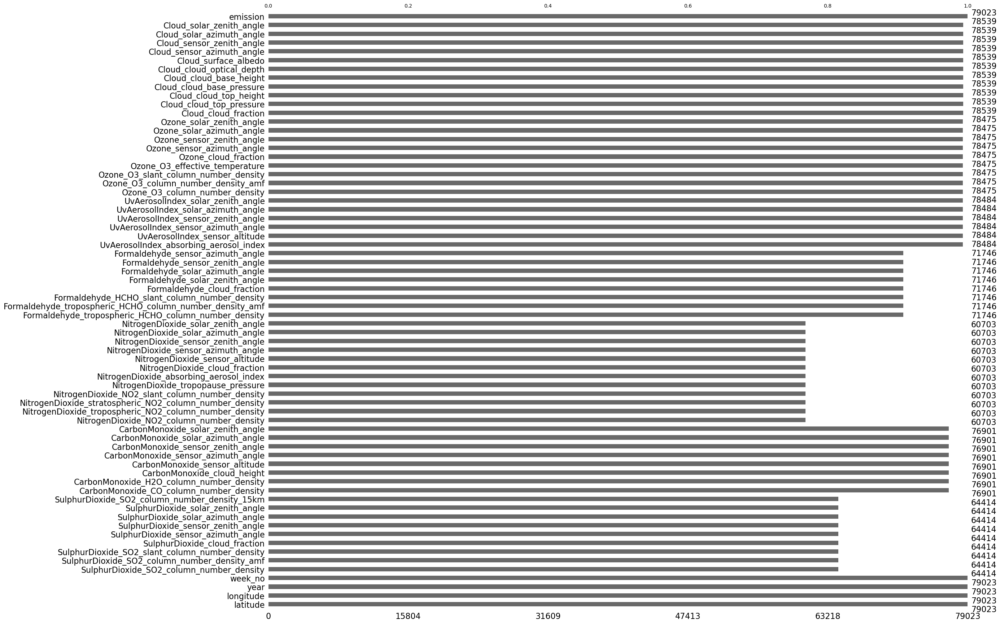

In [15]:
# visualize missing data after dropping the 7 features
msno.bar(train_data);

# correlation matrix

- Given the high dimensionality of the features, we sampled 10 features plus the label to observe correlations amongst features and how different features correlate with the target

<Axes: >

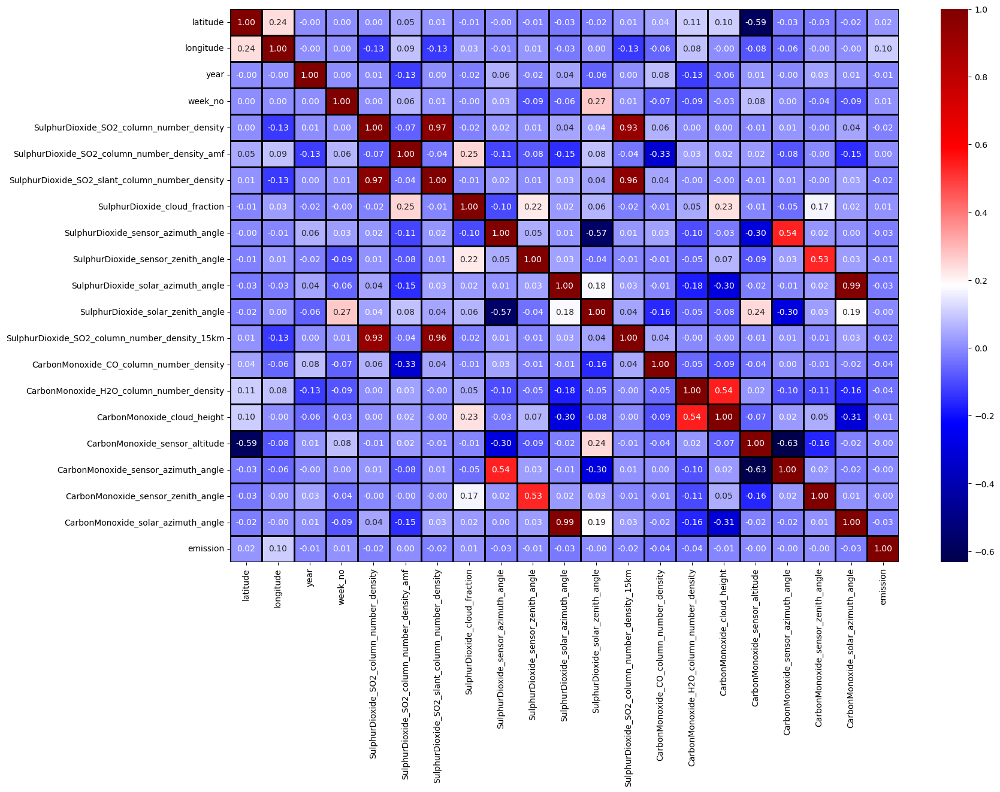

In [16]:
fig, ax =plt.subplots(figsize=(18,12))
sb.heatmap(train_data[train_data.columns[:20].tolist() + [train_data.columns[-1]]].corr(), 
           linewidths=1, linecolor='black', cmap='seismic', annot=True, fmt = '.2f')

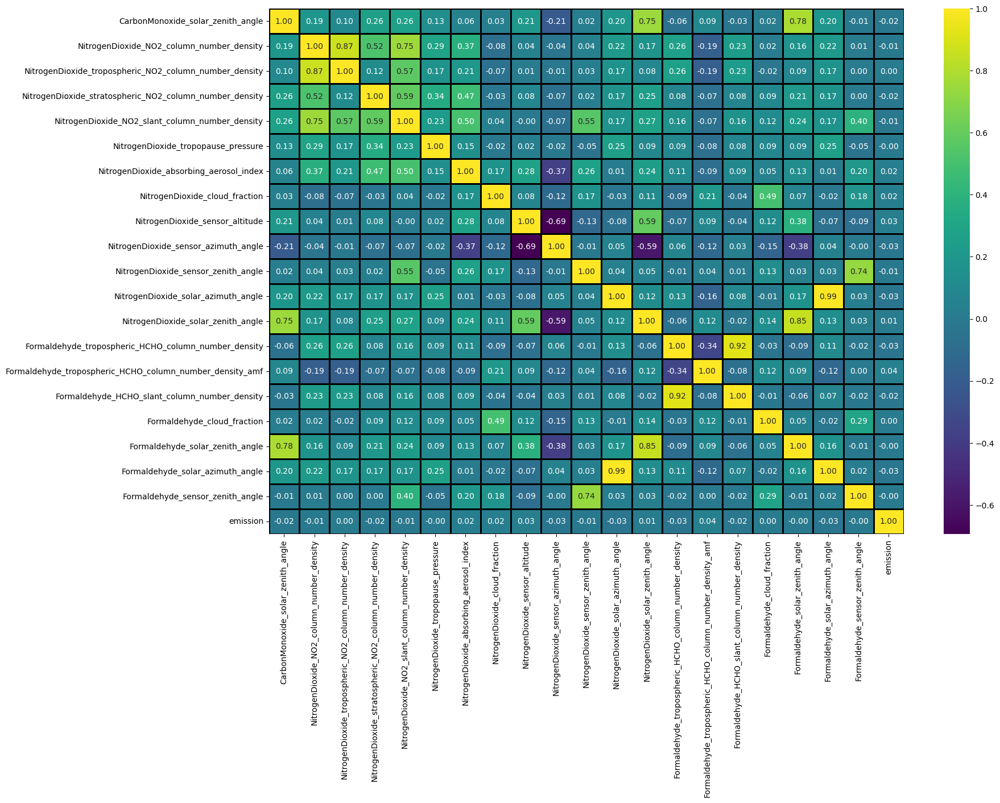

In [17]:
fig, ax =plt.subplots(figsize=(18,12))
sb.heatmap(train_data[train_data.columns[20:40].tolist() + [train_data.columns[-1]]].corr(), 
           linewidths=1, linecolor='black', cmap='viridis', annot=True, fmt = '.2f');

## NOTE: Very high correlation observed amongst some features 
- so we tried to quantify the level of correlation between different pair of features

In [18]:
threshold = 0.8  # We set a threshold of 0.8 correlation coefficient
correlation_matrix = train_data.corr()

# Find pairs of highly correlated features
highly_correlated = (correlation_matrix.abs() > threshold)
correlated_pairs = [(i, j) for i in range(len(highly_correlated.columns)) for j in range(i+1, len(highly_correlated.columns)) if highly_correlated.iloc[i, j]]

print("Highly correlated feature pairs:")
for pair in correlated_pairs:
    print(f"Features {correlation_matrix.columns[pair[0]]} and {correlation_matrix.columns[pair[1]]} are highly correlated.")

Highly correlated feature pairs:
Features SulphurDioxide_SO2_column_number_density and SulphurDioxide_SO2_slant_column_number_density are highly correlated.
Features SulphurDioxide_SO2_column_number_density and SulphurDioxide_SO2_column_number_density_15km are highly correlated.
Features SulphurDioxide_SO2_slant_column_number_density and SulphurDioxide_SO2_column_number_density_15km are highly correlated.
Features SulphurDioxide_sensor_azimuth_angle and NitrogenDioxide_sensor_azimuth_angle are highly correlated.
Features SulphurDioxide_sensor_zenith_angle and NitrogenDioxide_sensor_zenith_angle are highly correlated.
Features SulphurDioxide_solar_azimuth_angle and CarbonMonoxide_solar_azimuth_angle are highly correlated.
Features SulphurDioxide_solar_azimuth_angle and NitrogenDioxide_solar_azimuth_angle are highly correlated.
Features SulphurDioxide_solar_azimuth_angle and Formaldehyde_solar_azimuth_angle are highly correlated.
Features SulphurDioxide_solar_azimuth_angle and UvAerosolI

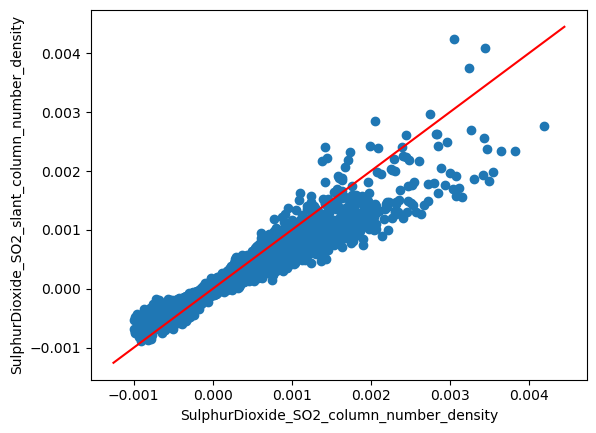

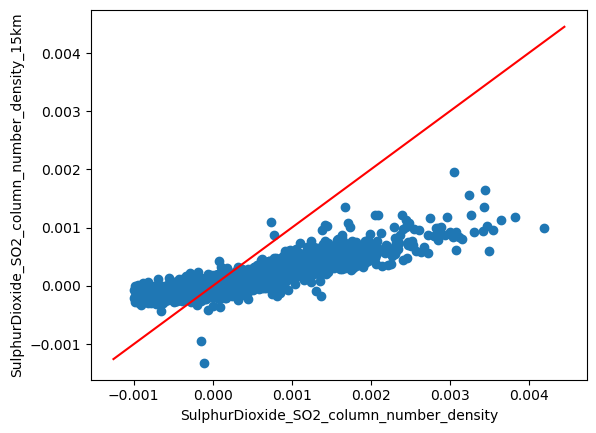

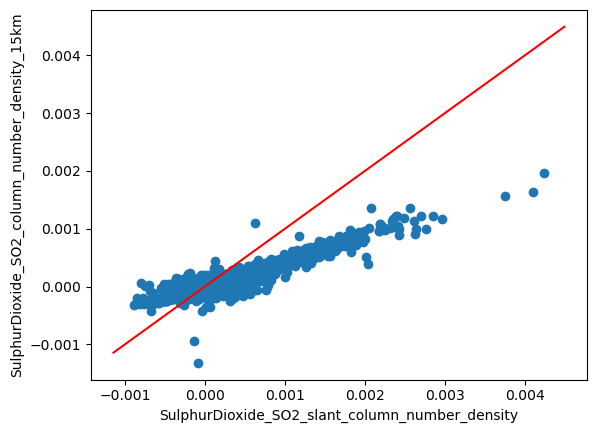

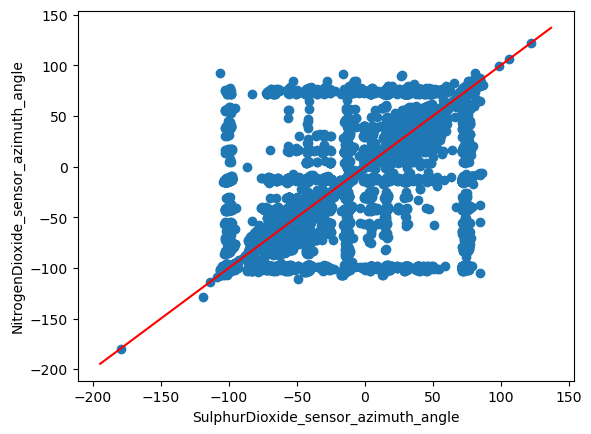

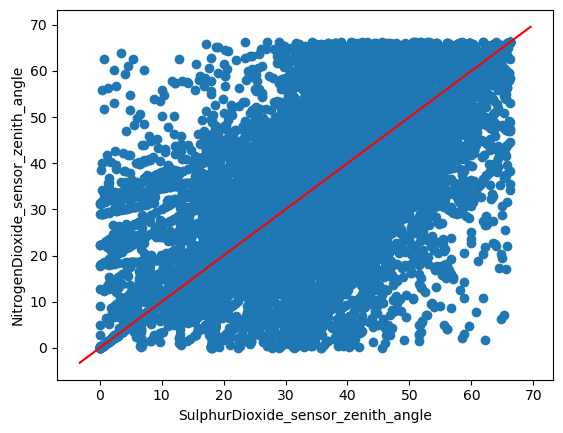

...

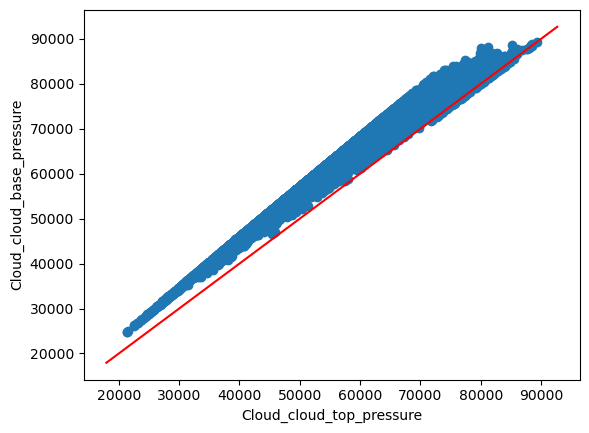

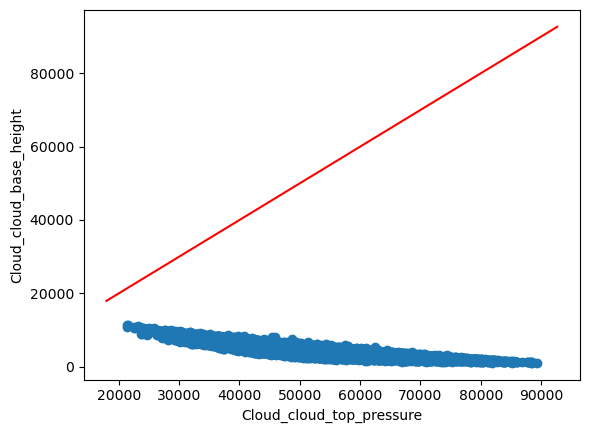

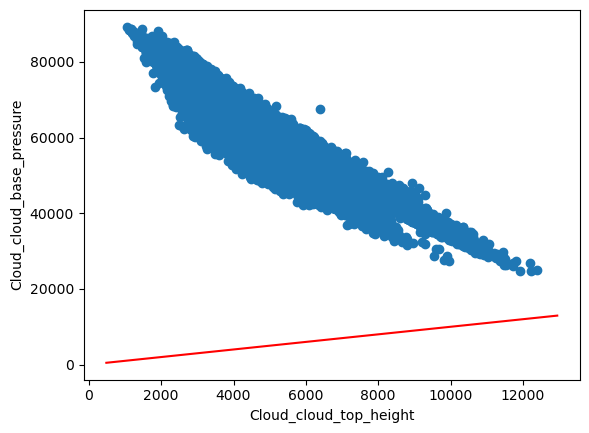

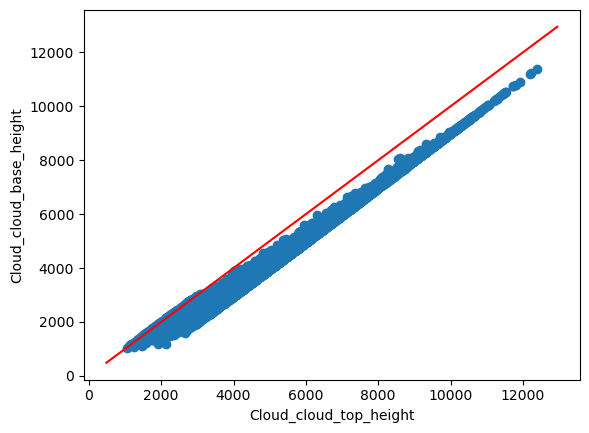

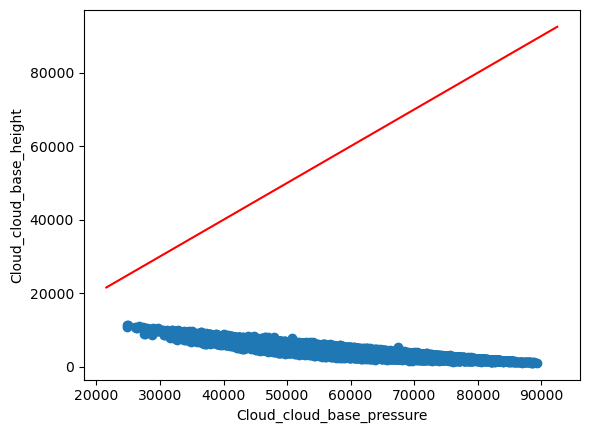

In [19]:
import matplotlib as mt
# Plot scatterplots for highly correlated feature pairs
for pair in correlated_pairs:
    feature1 = correlation_matrix.columns[pair[0]]
    feature2 = correlation_matrix.columns[pair[1]]
    fig, axes = plt.subplots() # 1 row, 2 columns

    axes.scatter(data=train_data, x=feature1, y=feature2)
    axes.set_xlabel(feature1)
    axes.set_ylabel(feature2)
    x = np.linspace(*axes.get_xlim())
    axes.plot(x, x, color='red')
    plt.show()
    fig.tight_layout()


In [20]:
# Covariance
train_data.cov()

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
latitude,4.823611e-01,1.348023e-01,-4.341099e-12,1.022816e-14,6.681387e-07,0.005845,1.063684e-06,-4.194677e-04,-0.219481,-0.137752,...,147.544115,-936.758707,141.358775,0.463533,5.690876e-03,-0.219789,-0.094958,-0.756272,-0.062634,1.788971
longitude,1.348023e-01,6.567083e-01,-1.605737e-12,1.675875e-15,-2.824916e-05,0.012887,-2.160928e-05,1.649893e-03,-0.649591,0.155768,...,71.985645,-324.159336,65.406618,-0.794725,-1.732531e-03,-0.410260,-0.181862,-0.160552,0.029339,12.014855
year,-4.341099e-12,-1.605737e-12,6.666751e-01,5.252524e-14,1.178415e-06,-0.019361,5.695767e-07,-1.320833e-03,3.061173,-0.204626,...,93.744317,267.276450,62.675715,-1.305282,-3.791180e-03,0.055284,0.110066,0.121814,0.003211,-1.560386
week_no,1.022816e-14,1.675875e-15,5.252524e-14,2.340030e+02,1.417901e-05,0.176568,3.513626e-05,-1.773244e-03,26.700434,-19.231594,...,1714.945467,3622.110744,1400.312402,14.123980,-3.467052e-02,-3.411066,6.176152,-44.076122,26.594593,15.641387
SulphurDioxide_SO2_column_number_density,6.681387e-07,-2.824916e-05,1.178415e-06,1.417901e-05,7.399969e-08,-0.000003,5.408450e-08,-2.931497e-07,0.000280,0.000033,...,0.000367,0.025630,0.000841,-0.000026,-1.215503e-07,0.000154,0.000041,0.000412,0.000061,-0.000733
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Cloud_sensor_azimuth_angle,-2.197895e-01,-4.102601e-01,5.528359e-02,-3.411066e+00,1.541690e-04,-0.294291,1.038166e-04,7.396553e-02,416.658377,20.237531,...,354.690759,-11797.116469,122.117390,-17.625231,-8.352400e-02,922.607938,-3.984539,-57.046461,-47.829797,34.067516
Cloud_sensor_zenith_angle,-9.495783e-02,-1.818618e-01,1.100656e-01,6.176152e+00,4.127824e-05,-0.029701,3.048055e-05,-1.439851e-02,7.458157,14.433686,...,646.162959,-2493.499942,603.111010,13.240158,2.993526e-02,-3.984539,41.321966,10.103875,3.227182,-14.907984
Cloud_solar_azimuth_angle,-7.562720e-01,-1.605524e-01,1.218142e-01,-4.407612e+01,4.116810e-04,-1.026029,2.760622e-04,5.561605e-02,10.660270,14.058935,...,-14800.869277,123470.256630,-14259.382094,-124.667159,-3.397992e-01,-57.046461,10.103875,1431.658925,35.062209,-132.402061
Cloud_solar_zenith_angle,-6.263422e-02,2.933860e-02,3.210757e-03,2.659459e+01,6.142720e-05,0.033644,5.490189e-05,-9.056442e-03,-14.402602,-2.727467,...,-1087.477248,10734.263599,-1046.717636,-2.102991,4.473248e-02,-47.829797,3.227182,35.062209,19.393766,-13.935261


## Visualize the target label (emission) and filter by year

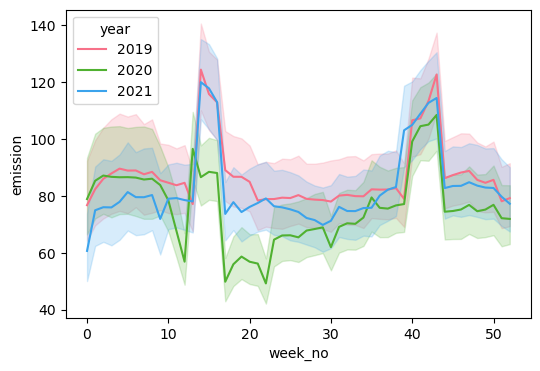

In [21]:
palette = sb.color_palette("husl", len(train_data_copy['year'].unique()))
fig, ax = plt.subplots(figsize=(6,4))
sb.lineplot(data=train_data_copy, x = 'week_no', 
            y = 'emission',
            hue='year',
           palette = palette);
plt.show()

> 2019 and 2021 emission have similar behavior while 2020 emission is significantly lower especially from week 10 to week 30

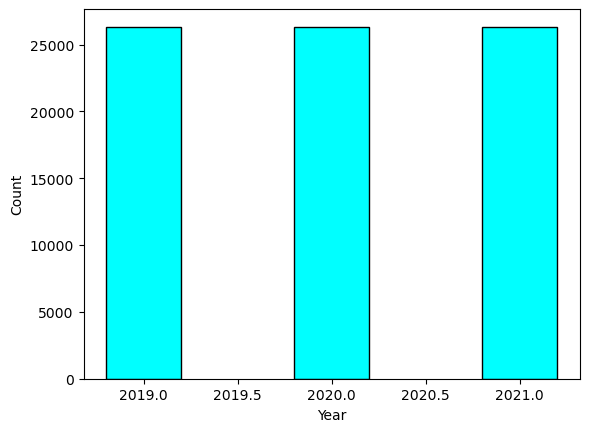

In [22]:
plt.bar(dict(train_data['year'].value_counts()).keys(), dict(train_data['year'].value_counts()).values(),
        width=0.4, color='cyan', edgecolor='k')
plt.xlabel('Year')
plt.ylabel('Count');
    

> Data seems balanced by year

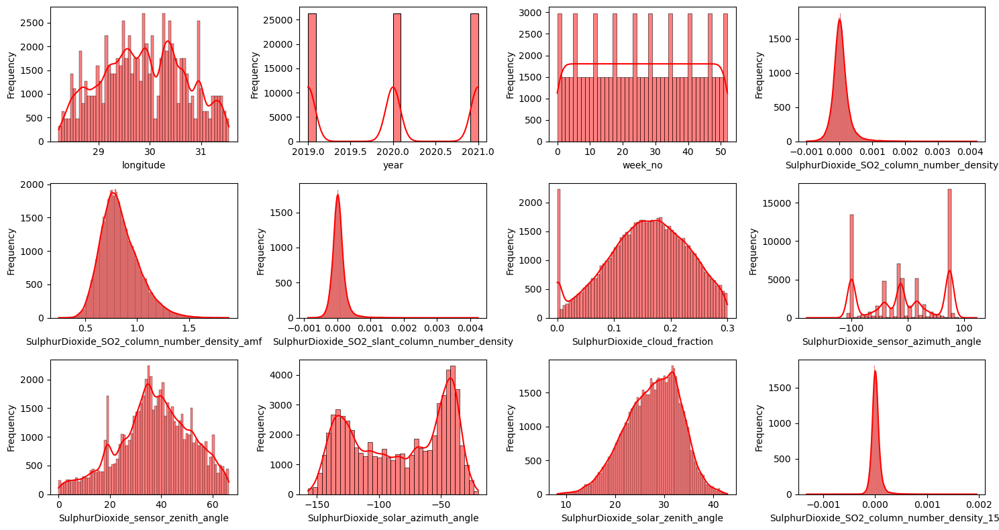

In [23]:
plt.figure(figsize=(15, 8))  # Adjust figsize as needed
for i, column in enumerate(train_data.columns[1:13]):
    plt.subplot(3, 4, i + 1)  # Adjust the layout according to the number of features
    sb.histplot(train_data[column], kde=True, color='red')  # Use histplot to show the distribution
#     plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show();

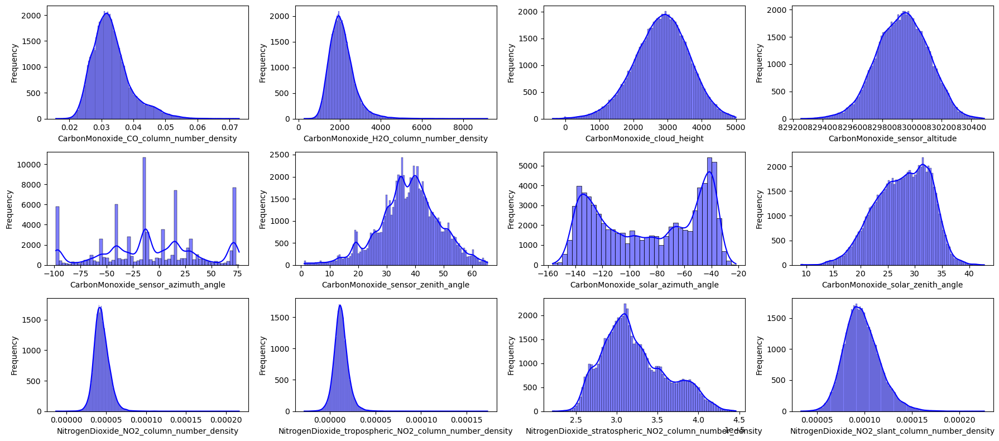

In [24]:
plt.figure(figsize=(18, 8))  # Adjust figsize as needed
for i, column in enumerate(train_data.columns[13:25]):
    plt.subplot(3, 4, i + 1)  # Adjust the layout according to the number of features
    sb.histplot(train_data[column], kde=True, color='blue')  # Use histplot to show the distribution
#     plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

(0.0, 500.0)

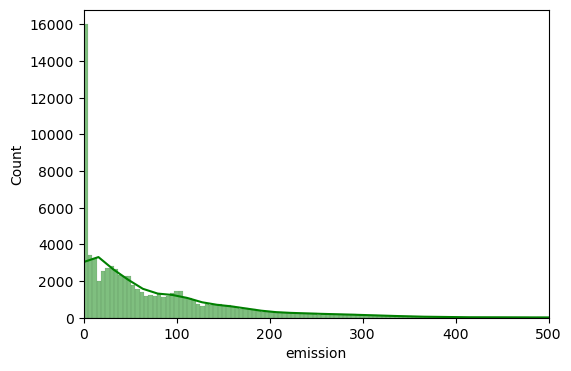

In [25]:
fig, ax = plt.subplots(figsize=(6,4))
sb.histplot(train_data['emission'], kde=True, color='green')
#plt.ylim(0,1600)
plt.xlim(0,500)

<Axes: xlabel='emission', ylabel='Count'>

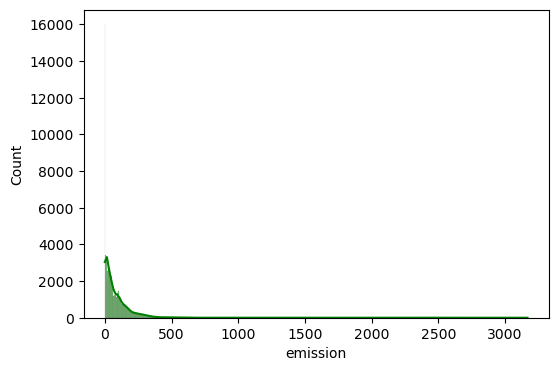

In [26]:
fig, ax = plt.subplots(figsize=(6,4))
sb.histplot(train_data['emission'], kde=True, color='green')
#plt.ylim(0,500)

Text(0.5, 0, 'emission')

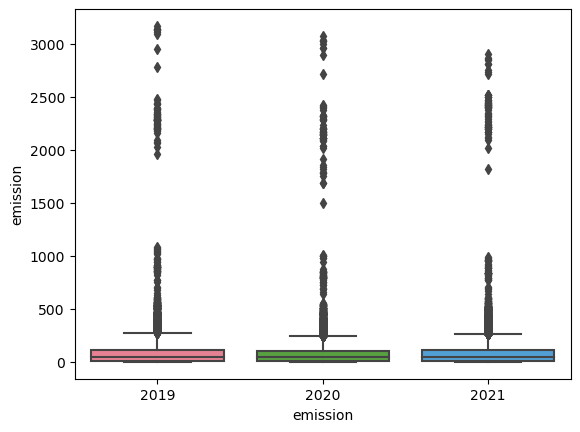

In [27]:
palette = sb.color_palette("husl", len(train_data_copy['year'].unique()))
sb.boxplot(data=train_data, x='year', y='emission',palette=palette)
#plt.ylim(0,500)
plt.xlabel('emission')

Text(0.5, 0, 'Year')

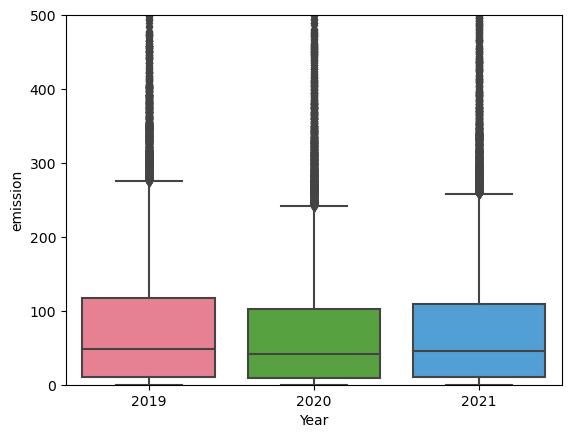

In [28]:
palette = sb.color_palette("husl", len(train_data_copy['year'].unique()))
sb.boxplot(data=train_data, x='year', y='emission',palette=palette)
plt.ylim(0,500)
plt.xlabel('Year')

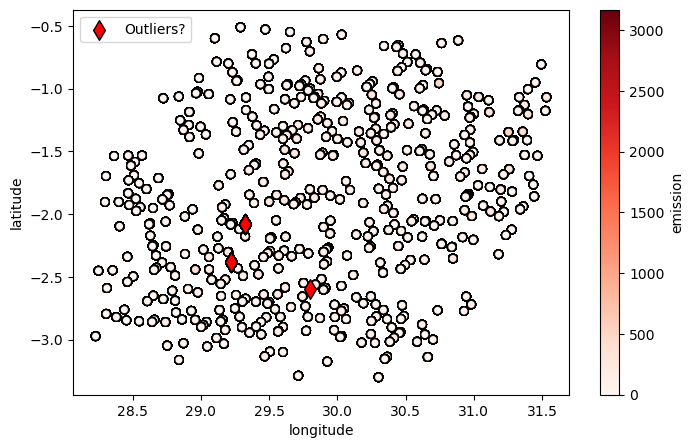

In [29]:
Q1 = train_data['emission'].quantile(0.05)
Q3 = train_data['emission'].quantile(0.95)
IQR = Q3 - Q1

# Define the threshold for outliers
lower_threshold = Q1 - 1.5 * IQR
upper_threshold = Q3 + 1.5 * IQR

# Identify outliers
outliers = train_data[(train_data['emission'] < lower_threshold) | (train_data['emission'] > upper_threshold)]

# Create the scatter plot
fig, ax = plt.subplots(figsize=(8,5))
scatter = ax.scatter(train_data['longitude'], train_data['latitude'], c=train_data['emission'], cmap='Reds', edgecolor='k')

# Highlight outliers in a different color and with larger size
ax.scatter(outliers['longitude'], outliers['latitude'], c='red', s=100, marker='d', label='Outliers?', edgecolor='k')

cbar = plt.colorbar(scatter)
cbar.set_label('emission')

plt.xlabel('longitude')
plt.ylabel('latitude')


ax.legend(loc='upper left')

plt.show()

## DATA PREPROCESING

1. Treat null values

2. Scale features

3. Split treated training dataset into training and validation dataset

In [30]:
# Copy the treated train_data (where we've dropped 7 columns with very high number of missing data)
train_data_copy2 = train_data.copy()

In [31]:
# Drop missing values
train_data.dropna(inplace=True)

In [32]:
train_data.shape, train_data_copy2.shape

((57209, 68), (79023, 68))

> We still have 57209 by 69 data to work with after dropping the missing values

In [33]:
train_data.isna().sum()

latitude                                    0
longitude                                   0
year                                        0
week_no                                     0
SulphurDioxide_SO2_column_number_density    0
                                           ..
Cloud_sensor_azimuth_angle                  0
Cloud_sensor_zenith_angle                   0
Cloud_solar_azimuth_angle                   0
Cloud_solar_zenith_angle                    0
emission                                    0
Length: 68, dtype: int64

In [34]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57209 entries, 1 to 79022
Data columns (total 68 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   latitude                                                  57209 non-null  float64
 1   longitude                                                 57209 non-null  float64
 2   year                                                      57209 non-null  int64  
 3   week_no                                                   57209 non-null  int64  
 4   SulphurDioxide_SO2_column_number_density                  57209 non-null  float64
 5   SulphurDioxide_SO2_column_number_density_amf              57209 non-null  float64
 6   SulphurDioxide_SO2_slant_column_number_density            57209 non-null  float64
 7   SulphurDioxide_cloud_fraction                             57209 non-null  float64
 8   SulphurDioxide_s

In [35]:
train_data.describe()

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
count,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,...,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000
mean,-1.896526,29.911039,2019.984618,25.756909,0.000048,0.828272,0.000035,0.149240,-9.326873,36.871226,...,5456.445654,60352.642205,4553.952322,17.320206,0.268583,-10.862038,40.280222,-83.939996,27.900503,82.428368
std,0.703606,0.801112,0.816922,14.744678,0.000263,0.176912,0.000195,0.067927,62.498784,13.688283,...,1461.920321,9256.870559,1384.342820,12.484591,0.050523,31.264938,6.512705,37.448801,4.458828,139.220813
min,-3.299000,28.228000,2019.000000,0.000000,-0.000996,0.320208,-0.000887,0.000000,-179.537059,0.099237,...,1050.661782,24779.033704,1050.496816,1.844529,0.017697,-101.831810,3.341816,-152.646400,12.165310,0.000000
25%,-2.479000,29.290000,2019.000000,13.000000,-0.000093,0.704617,-0.000075,0.104521,-56.226482,28.685590,...,4411.871911,53900.510265,3521.758671,9.078037,0.238249,-30.497392,35.712152,-122.818964,24.530200,11.053095
50%,-1.911000,29.917000,2020.000000,26.000000,0.000025,0.804802,0.000019,0.152850,-12.551151,37.146735,...,5423.014905,60297.061346,4489.444789,13.481056,0.270476,-12.696775,40.831426,-79.351270,28.344925,46.732140
75%,-1.283000,30.480000,2021.000000,38.000000,0.000152,0.932060,0.000119,0.198379,54.713985,46.447449,...,6437.602188,66974.791314,5478.562898,21.164237,0.301041,15.254924,44.449427,-46.237804,31.527668,110.524880
max,-0.510000,31.532000,2021.000000,52.000000,0.003823,1.815032,0.003753,0.299977,122.095200,66.242012,...,12384.239458,89291.615576,11384.239458,198.253357,0.599573,78.223037,65.951248,-22.653170,42.060436,3167.768000


## scale features

- As observed from the histogram plot above, different feature exhibits different distribution, mean, range, etc.
To avoid the model placing more weights on data with higher values, we scaled the features so we can have a common mean and distribution

In [36]:
train_data.describe()

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
count,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,...,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000,57209.000000
mean,-1.896526,29.911039,2019.984618,25.756909,0.000048,0.828272,0.000035,0.149240,-9.326873,36.871226,...,5456.445654,60352.642205,4553.952322,17.320206,0.268583,-10.862038,40.280222,-83.939996,27.900503,82.428368
std,0.703606,0.801112,0.816922,14.744678,0.000263,0.176912,0.000195,0.067927,62.498784,13.688283,...,1461.920321,9256.870559,1384.342820,12.484591,0.050523,31.264938,6.512705,37.448801,4.458828,139.220813
min,-3.299000,28.228000,2019.000000,0.000000,-0.000996,0.320208,-0.000887,0.000000,-179.537059,0.099237,...,1050.661782,24779.033704,1050.496816,1.844529,0.017697,-101.831810,3.341816,-152.646400,12.165310,0.000000
25%,-2.479000,29.290000,2019.000000,13.000000,-0.000093,0.704617,-0.000075,0.104521,-56.226482,28.685590,...,4411.871911,53900.510265,3521.758671,9.078037,0.238249,-30.497392,35.712152,-122.818964,24.530200,11.053095
50%,-1.911000,29.917000,2020.000000,26.000000,0.000025,0.804802,0.000019,0.152850,-12.551151,37.146735,...,5423.014905,60297.061346,4489.444789,13.481056,0.270476,-12.696775,40.831426,-79.351270,28.344925,46.732140
75%,-1.283000,30.480000,2021.000000,38.000000,0.000152,0.932060,0.000119,0.198379,54.713985,46.447449,...,6437.602188,66974.791314,5478.562898,21.164237,0.301041,15.254924,44.449427,-46.237804,31.527668,110.524880
max,-0.510000,31.532000,2021.000000,52.000000,0.003823,1.815032,0.003753,0.299977,122.095200,66.242012,...,12384.239458,89291.615576,11384.239458,198.253357,0.599573,78.223037,65.951248,-22.653170,42.060436,3167.768000


In [37]:
scaler = StandardScaler()
features_scaled = scaler.fit_transform(train_data.drop('emission', axis=1))
features_scaled

array([[ 1.97061621, -0.77522789, -1.20528746, ..., -0.11095167,
        -1.63541871, -0.14549329],
       [ 1.97061621, -0.77522789, -1.20528746, ..., -1.51680216,
        -1.56427068, -0.38288593],
       [ 1.97061621, -0.77522789, -1.20528746, ..., -0.44332856,
        -1.53730725, -1.27745248],
       ...,
       [-1.99328254,  0.48677831,  1.24294668, ...,  1.11294405,
        -1.34352274,  0.64388906],
       [-1.99328254,  0.48677831,  1.24294668, ...,  1.23074815,
        -1.4822461 ,  0.2719046 ],
       [-1.99328254,  0.48677831,  1.24294668, ...,  1.17359611,
        -1.39818752,  0.52612577]])

In [38]:
features_scaled.shape, train_data.shape

((57209, 67), (57209, 68))

In [39]:
features_scaled_df = pd.DataFrame(data=features_scaled, columns=train_data.columns[:-1])

In [40]:
target = train_data['emission']

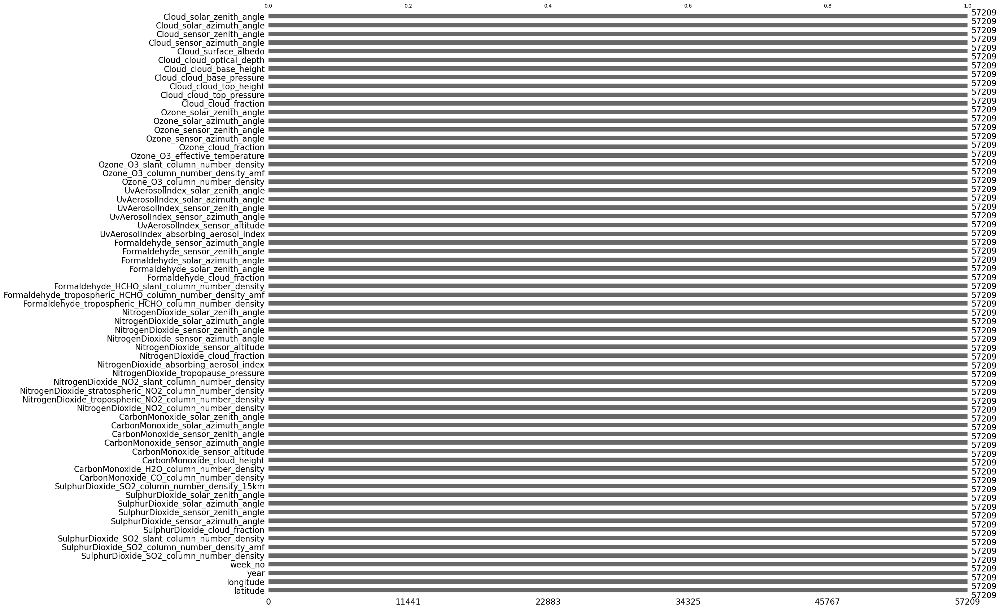

In [41]:
msno.bar(features_scaled_df);

## Split training data into training and validation

In [42]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(features_scaled_df, target, test_size=0.2, random_state=42)

## Build model

Models to implement

1. SGD regressor

2. SVR

3. Ensemble regressor

4. Ridge regression

5. XGBoost

6. Neural network

In [43]:
from sklearn.linear_model import SGDRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
import xgboost as xgb

from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_predict

In [44]:
# Initial build on all features to gain an insight to best performing model(s)
# Used model's default hyperparameters at first
models = {
    'SGD Regressor': SGDRegressor(random_state=1212),
    'SVR': SVR(),
    'Ensemble Regressor': RandomForestRegressor(random_state=1212),
    'Ridge Regression': Ridge(random_state=1212)
}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)
    
    rmse = mean_squared_error(y_val, y_pred, squared=False)
    acc = r2_score(y_val, y_pred)
    
    print(f"{name} RMSE: {rmse} and Accuracy: {acc}")

SGD Regressor RMSE: 129.01023531557473 and Accuracy: 0.03134738728766029
SVR RMSE: 131.31384717387064 and Accuracy: -0.0035540547539612
Ensemble Regressor RMSE: 21.771291753301877 and Accuracy: 0.9724140391881747
Ridge Regression RMSE: 128.69759238290877 and Accuracy: 0.03603655693777774


> RandomForestRegressor gave a much better initial performance

Implement XGBoost

In [45]:
def train_xgboost_model(X_train, y_train, X_val, y_val, iteration):
    xg_train = xgb.DMatrix(X_train, label=y_train)
    xg_val = xgb.DMatrix(X_val, label=y_val)

    params = {
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse',
        'max_depth': 6,
        'eta': 0.1,
        'subsample': 0.8,
        'colsample_bytree': 0.8
    }

    iteration = iteration
    eval_results = {}

    def eval_metric_rmse(preds, train):
        labels = train.get_label()
        rmse = mean_squared_error(labels, preds, squared=False)
        return 'rmse', rmse

    model_xgb = xgb.train(params, xg_train, iteration, evals=[(xg_train, 'Train'), (xg_val, 'Validation')],
                          early_stopping_rounds=10, evals_result=eval_results, feval=eval_metric_rmse, verbose_eval=True)

    y_pred_xgb = model_xgb.predict(xg_val)

    rmse_xgb = mean_squared_error(y_val, y_pred_xgb, squared=False)
    print(f"XGBoost RMSE: {rmse_xgb}")
    print(f'XGBoost Accuracy: {r2_score(y_val, y_pred_xgb)}')

    # Plotting RMSE for each round
    train_rmse = eval_results['Train']['rmse']
    val_rmse = eval_results['Validation']['rmse']

    fig, ax = plt.subplots(figsize=(8, 5))
    plt.plot(train_rmse, label='Train RMSE')
    plt.plot(val_rmse, label='Validation RMSE')
    plt.ylabel('RMSE')
    plt.title('RMSE per Round during XGBoost Training')
    plt.legend()
    plt.grid(True)
    plt.xlim(0, iteration)
    plt.show()

    return model_xgb, eval_results, rmse_xgb, y_pred_xgb

[0]	Train-rmse:132.79831	Validation-rmse:123.75073
[1]	Train-rmse:125.60815	Validation-rmse:117.86186
[2]	Train-rmse:119.86079	Validation-rmse:112.90111
[3]	Train-rmse:114.46549	Validation-rmse:108.71730
[4]	Train-rmse:109.99287	Validation-rmse:104.84577
[5]	Train-rmse:106.19457	Validation-rmse:101.63926
[6]	Train-rmse:100.44872	Validation-rmse:96.45560
[7]	Train-rmse:97.75468	Validation-rmse:94.24935
[8]	Train-rmse:95.09370	Validation-rmse:91.55531
[9]	Train-rmse:92.65537	Validation-rmse:89.38109
[10]	Train-rmse:90.65273	Validation-rmse:87.77329
[11]	Train-rmse:87.76608	Validation-rmse:85.18593
[12]	Train-rmse:86.41258	Validation-rmse:84.03934
[13]	Train-rmse:85.80612	Validation-rmse:83.44144
[14]	Train-rmse:84.25363	Validation-rmse:82.15454
[15]	Train-rmse:82.75213	Validation-rmse:80.77891
[16]	Train-rmse:80.77761	Validation-rmse:78.99334
[17]	Train-rmse:79.64397	Validation-rmse:77.93603
[18]	Train-rmse:78.66457	Validation-rmse:77.02898
[19]	Train-rmse:75.87686	Validation-rmse:74.722

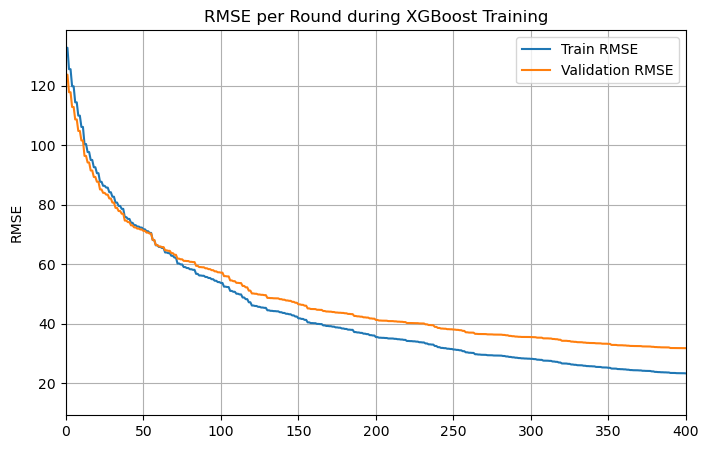

In [46]:
model_xg, eval_results, rmse, y_pred_xgb = train_xgboost_model(X_train, y_train, X_val, y_val, 400)

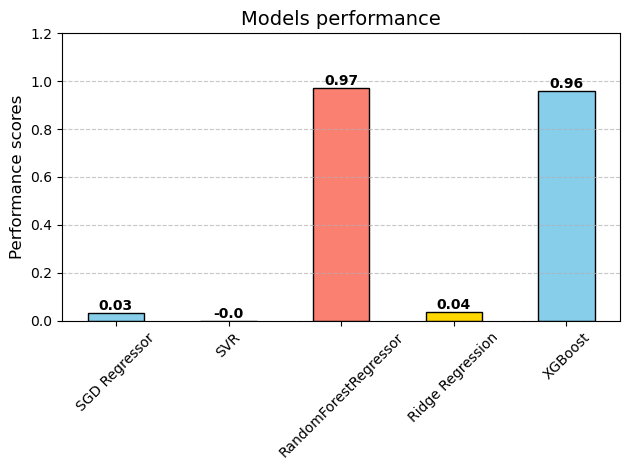

In [47]:
mod = pd.DataFrame({'SGD Regressor': 0.032,
              'SVR': -0.002169,
              'RandomForestRegressor':0.972,
              'Ridge Regression': 0.036,
                    'XGBoost': 0.958
    
}, index=np.arange(1))

bars = plt.bar(dict(mod.iloc[0]).keys(), dict(mod.iloc[0]).values(), width=0.5, color=['skyblue', 'lightgreen', 'salmon', 'gold'], edgecolor='black')

for bar in bars:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), round(bar.get_height(), 2), ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.ylim(0, 1.2)  # Setting y-axis limits from 0 to 1 for better visualization of performance scores
# plt.xlabel('Models', fontsize=12)
plt.ylabel('Performance scores', fontsize=12)
plt.title('Models performance', fontsize=14)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

# explore optimal n_estimator

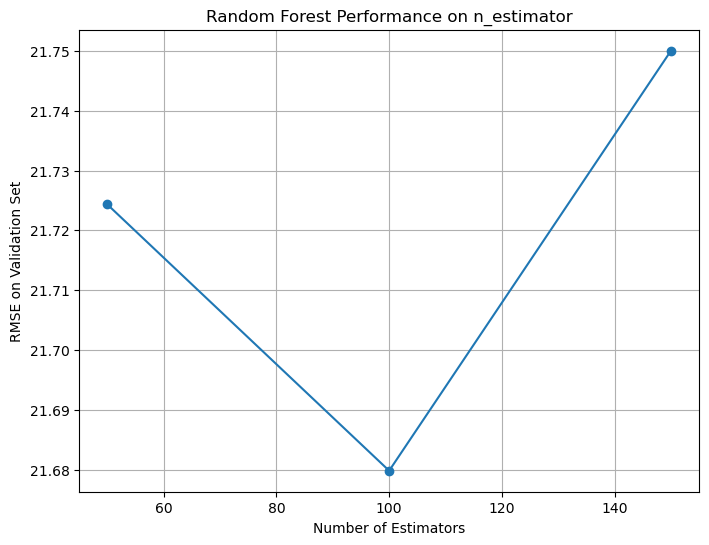

In [48]:
rmse_values = []
estimators_range = [50, 100, 150]

for n in estimators_range:
    model_rf = RandomForestRegressor(n_estimators=n, random_state=42)
    model_rf.fit(X_train, y_train)
    y_pred_rf = model_rf.predict(X_val)
    rmse = mean_squared_error(y_val, y_pred_rf, squared=False)
    rmse_values.append(rmse)

plt.figure(figsize=(8, 6))
plt.plot(estimators_range, rmse_values, marker='o')
plt.xlabel('Number of Estimators')
plt.ylabel('RMSE on Validation Set')
plt.ylim(21,23)
plt.title('Random Forest Performance on n_estimator')
plt.grid(True)
plt.show()

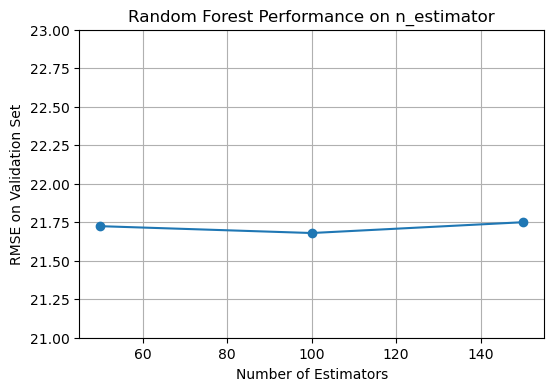

In [101]:
plt.figure(figsize=(6, 4))
plt.plot(estimators_range, rmse_values, marker='o')
plt.xlabel('Number of Estimators')
plt.ylabel('RMSE on Validation Set')
plt.ylim(21,23)
plt.title('Random Forest Performance on n_estimator')
plt.grid(True)
plt.show()

In [49]:
model_rf = RandomForestRegressor(n_estimators=100).fit(X_train, y_train)
y_pred_rf = model_rf.predict(X_val)

In [50]:
from sklearn.metrics import r2_score
r2_score(y_val, y_pred_rf)

0.9724421758829587

In [51]:
train_data['emission'].describe()

count    57209.000000
mean        82.428368
std        139.220813
min          0.000000
25%         11.053095
50%         46.732140
75%        110.524880
max       3167.768000
Name: emission, dtype: float64

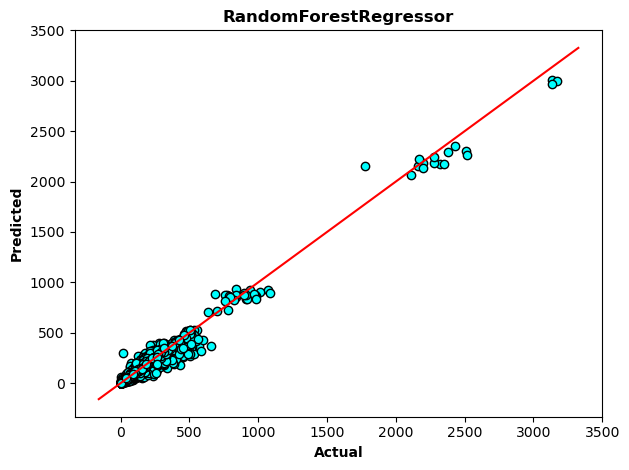

In [52]:
fig, ax = plt.subplots()

ax.scatter(x=y_val, y=y_pred_rf, color = 'cyan', edgecolor='k')

ax.set_xlabel('Actual', fontweight='bold')
ax.set_ylabel('Predicted', fontweight='bold')
ax.set_title('RandomForestRegressor', fontweight='bold')
x = np.linspace(*ax.get_xlim())
ax.plot(x, x, color='red')
fig.tight_layout()
plt.show()

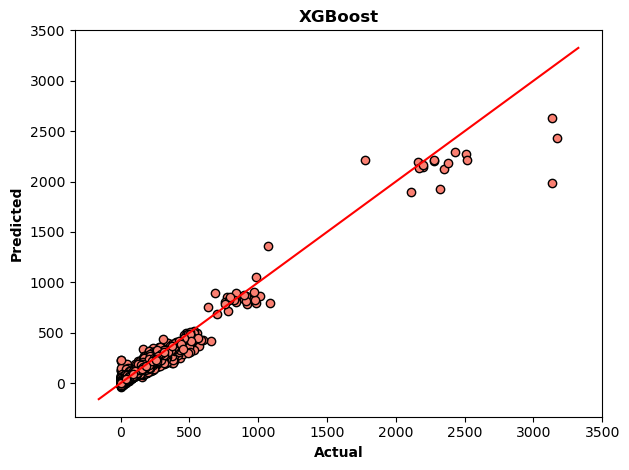

In [53]:
fig, ax = plt.subplots()
ax.scatter(y_val, y_pred_xgb, color = 'salmon', edgecolor='k')

ax.set_xlabel('Actual', fontweight='bold')
ax.set_ylabel('Predicted', fontweight='bold')
ax.set_title('XGBoost', fontweight='bold')
x = np.linspace(*ax.get_xlim())
ax.plot(x, x, color='red')
fig.tight_layout()

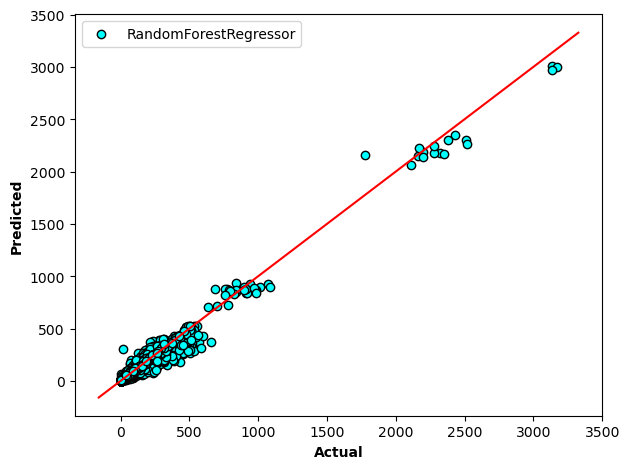

In [54]:
fig, ax = plt.subplots()

ax.scatter(y_val, y_pred_rf, color = 'cyan', edgecolor='k', label='RandomForestRegressor')
ax.set_xlabel('Actual', fontweight='bold')
ax.set_ylabel('Predicted', fontweight='bold')
x = np.linspace(*ax.get_xlim())
ax.plot(x, x, color='red')
ax.legend()

plt.tight_layout()

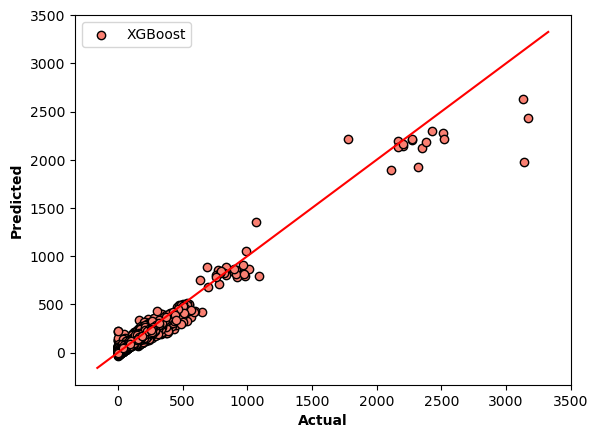

In [55]:
fig, ax = plt.subplots()
ax.scatter(y_val, y_pred_xgb, color = 'salmon', edgecolor='k', label='XGBoost')
ax.set_xlabel('Actual', fontweight='bold')
ax.set_ylabel('Predicted', fontweight='bold')
x = np.linspace(*ax.get_xlim())
ax.plot(x, x, color='red')
ax.legend()

## Feature importance for RandomForestRegressor

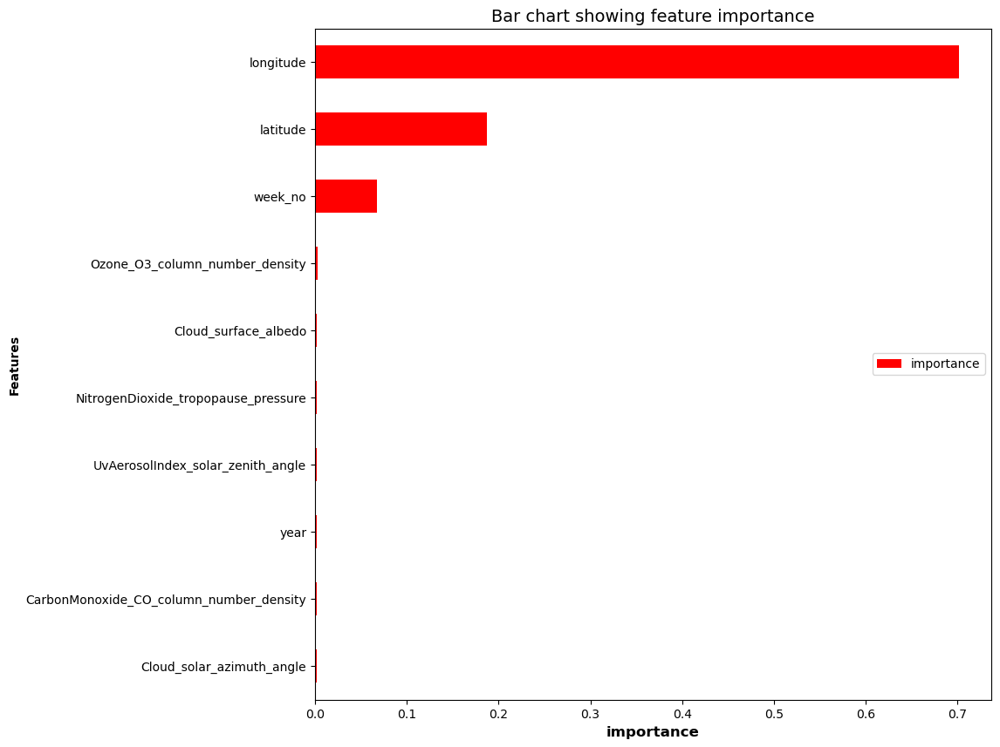

In [56]:
impo_df = pd.DataFrame({'feature': features_scaled_df.columns, 'importance': model_rf.feature_importances_}).set_index('feature').sort_values(by = 'importance', ascending = False)
impo_df_t10 = impo_df[:10].sort_values(by = 'importance', ascending = True)
impo_df_t10.plot(kind = 'barh', figsize = (10, 10), color='red')
plt.legend(loc = 'center right')
plt.title('Bar chart showing feature importance', fontsize = 14)
plt.xlabel('importance', fontsize = 12, fontweight='bold')
plt.ylabel('Features', fontweight='bold')
plt.show()

## Build Neural Network

In [57]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint

def create_regression_model(X_train, y_train, X_val, y_val, epoch, learning_rate):
    model = Sequential([
        Dense(1000, activation='relu', input_shape=(X_train.shape[1],)),
        Dense(750, activation='relu'),
        Dense(500, activation='relu'),
        Dense(1, activation='linear')
    ])

    # Learning rate scheduler
    def lr_scheduler(epoch, lr):
        if epoch % 10 == 0 and epoch != 0:
            return lr * 0.9  # Adjust the learning rate every 10 epochs
        else:
            return lr

    lr_callback = LearningRateScheduler(lr_scheduler)

    # Early stopping
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Model checkpoint
    checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', verbose=1, save_best_only=True, mode='min')

    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')
    history = model.fit(X_train, y_train, epochs=epoch, validation_data=(X_val, y_val),
                        callbacks=[lr_callback, early_stopping, checkpoint], verbose=1)
    
    y_pred = model.predict(X_val)

    rmse = mean_squared_error(y_val, y_pred, squared=False)
    r2 = r2_score(y_val, y_pred)

    print(f"Neural Network RMSE: {rmse}")
    print(f"Neural Network R^2 Score: {r2}")

    # Extracting loss values from history
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Plotting loss for training and validation sets
    epochs = range(1, len(train_loss) + 1)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    return model, history



Epoch 1/100

1427/1431 [============================>.] - ETA: 0s - loss: 19246.5176
Epoch 1: val_loss improved from inf to 15791.90625, saving model to best_model.h5
1431/1431 [==============================] - 13s 8ms/step - loss: 19221.5371 - val_loss: 15791.9062 - lr: 0.0010
Epoch 2/100
1425/1431 [============================>.] - ETA: 0s - loss: 17942.4473
Epoch 2: val_loss improved from 15791.90625 to 14954.77734, saving model to best_model.h5
1431/1431 [==============================] - 12s 8ms/step - loss: 17985.9277 - val_loss: 14954.7773 - lr: 0.0010
Epoch 3/100
1430/1431 [============================>.] - ETA: 0s - loss: 17412.7988
Epoch 3: val_loss improved from 14954.77734 to 14925.05078, saving model to best_model.h5
1431/1431 [==============================] - 12s 9ms/step - loss: 17412.1660 - val_loss: 14925.0508 - lr: 0.0010
Epoch 4/100
1430/1431 [============================>.] - ETA: 0s - loss: 16643.7617
Epoch 4: val_loss improved from 14925.05078 to 14767.88965, s

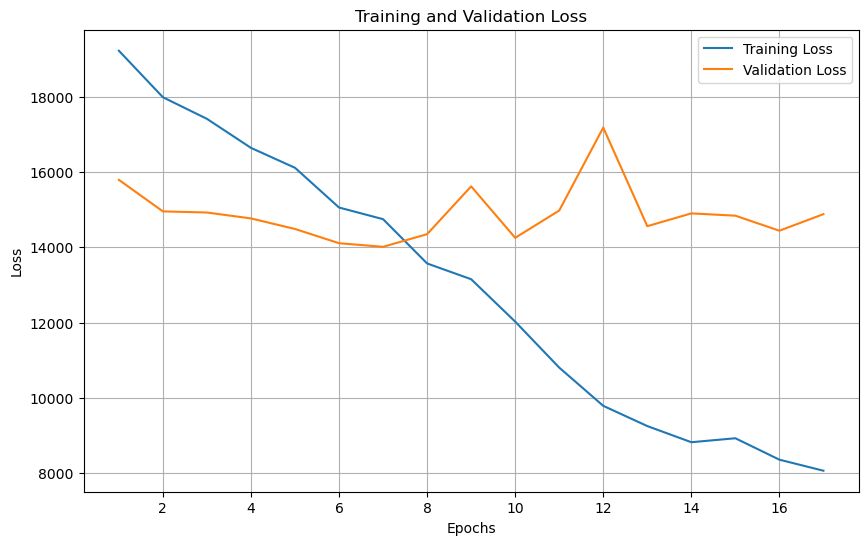

In [58]:
model_nn, history = create_regression_model(X_train, y_train, X_val, y_val, 100, 0.001)

## Performance with all features

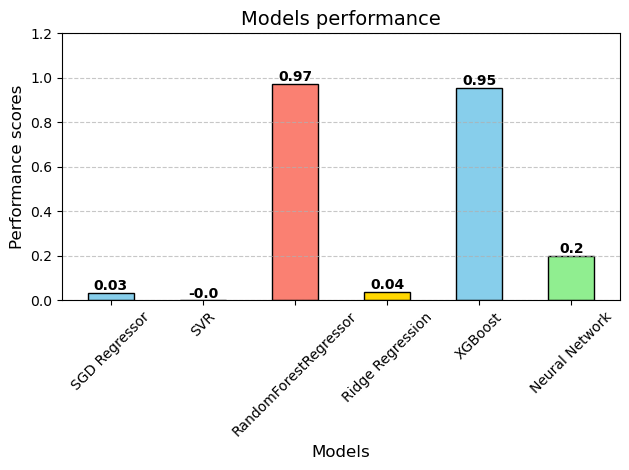

In [59]:
mod2 = pd.DataFrame({'SGD Regressor': 0.031,
              'SVR': -0.004,
              'RandomForestRegressor':0.972,
              'Ridge Regression': 0.036,
                    'XGBoost': 0.954,
                    'Neural Network': 0.198
    
}, index=np.arange(1))


bars2 = plt.bar(dict(mod2.iloc[0]).keys(), dict(mod2.iloc[0]).values(), width=0.5, color=['skyblue', 'lightgreen', 'salmon', 'gold'], edgecolor='black')

# Adding data labels on top of each bar
for bar in bars2:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), round(bar.get_height(), 2), ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.ylim(0, 1.2)  # Setting y-axis limits from 0 to 1 for better visualization of performance scores
plt.xlabel('Models', fontsize=12)
plt.ylabel('Performance scores', fontsize=12)
plt.title('Models performance', fontsize=14)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

# Sample top 10 features basd on feature importance

In [60]:
impo_df

,importance
feature,
longitude,0.701836
latitude,0.187536
week_no,0.067576
Ozone_O3_column_number_density,0.003124
Cloud_surface_albedo,0.001800
...,...
SulphurDioxide_solar_zenith_angle,0.000246
Formaldehyde_solar_zenith_angle,0.000241
Ozone_sensor_zenith_angle,0.000223


In [61]:
new_train = features_scaled_df[impo_df.index[:10]]

In [62]:
new_train.shape, train_data['emission'].shape

((57209, 10), (57209,))

In [63]:
X_train2, X_val2, y_train2, y_val2 = train_test_split(new_train, train_data.dropna()['emission'], test_size=0.2, random_state=1296)

In [64]:
X_train2.shape, y_train2.shape, X_val2.shape, y_val2.shape

((45767, 10), (45767,), (11442, 10), (11442,))

Epoch 1/100
1426/1431 [============================>.] - ETA: 0s - loss: 16763.9121
Epoch 1: val_loss improved from inf to 20792.07617, saving model to best_model.h5
1431/1431 [==============================] - 12s 8ms/step - loss: 16727.9531 - val_loss: 20792.0762 - lr: 0.0010
Epoch 2/100
1427/1431 [============================>.] - ETA: 0s - loss: 15071.1689
Epoch 2: val_loss improved from 20792.07617 to 19777.87109, saving model to best_model.h5
1431/1431 [==============================] - 11s 8ms/step - loss: 15044.9893 - val_loss: 19777.8711 - lr: 0.0010
Epoch 3/100
1429/1431 [============================>.] - ETA: 0s - loss: 14567.8877
Epoch 3: val_loss improved from 19777.87109 to 18970.99023, saving model to best_model.h5
1431/1431 [==============================] - 12s 8ms/step - loss: 14560.8945 - val_loss: 18970.9902 - lr: 0.0010
Epoch 4/100
1430/1431 [============================>.] - ETA: 0s - loss: 14047.5566
Epoch 4: val_loss improved from 18970.99023 to 18270.64062, sav

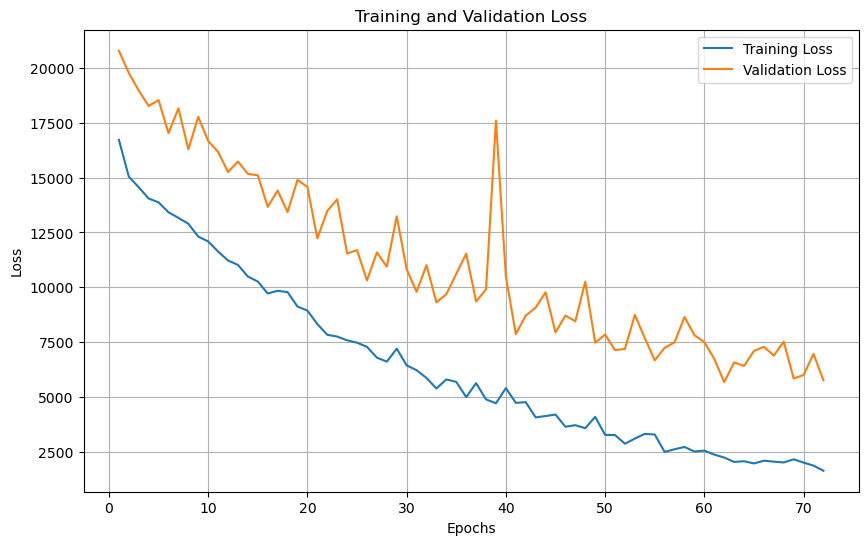

In [65]:
model_nn2, history2 = create_regression_model(X_train2, y_train2, X_val2, y_val2, 100, 0.001)

RandomForest

In [66]:
model_rf2 = RandomForestRegressor(n_estimators=100).fit(X_train2, y_train2)
y_pred_rf2 = model_rf2.predict(X_val2)
r2_score(y_val2, y_pred_rf2)

0.9870602613982583

XGBoost

[0]	Train-rmse:130.95695	Validation-rmse:149.83583
[1]	Train-rmse:124.41212	Validation-rmse:142.52826
[2]	Train-rmse:121.64185	Validation-rmse:139.46834
[3]	Train-rmse:114.36117	Validation-rmse:129.80563
[4]	Train-rmse:109.70904	Validation-rmse:124.62800
[5]	Train-rmse:105.57131	Validation-rmse:120.08606
[6]	Train-rmse:101.99783	Validation-rmse:116.17168
[7]	Train-rmse:97.16143	Validation-rmse:109.34602
[8]	Train-rmse:96.83160	Validation-rmse:109.11839
[9]	Train-rmse:96.20267	Validation-rmse:108.55816
[10]	Train-rmse:91.80163	Validation-rmse:102.36194
[11]	Train-rmse:91.50944	Validation-rmse:102.20865
[12]	Train-rmse:87.45122	Validation-rmse:96.67398
[13]	Train-rmse:84.07592	Validation-rmse:91.94534
[14]	Train-rmse:81.20864	Validation-rmse:87.85853
[15]	Train-rmse:79.49309	Validation-rmse:85.97981
[16]	Train-rmse:77.96548	Validation-rmse:84.39069
[17]	Train-rmse:76.51235	Validation-rmse:82.91698
[18]	Train-rmse:76.20402	Validation-rmse:82.74417
[19]	Train-rmse:74.43530	Validation-rmse:

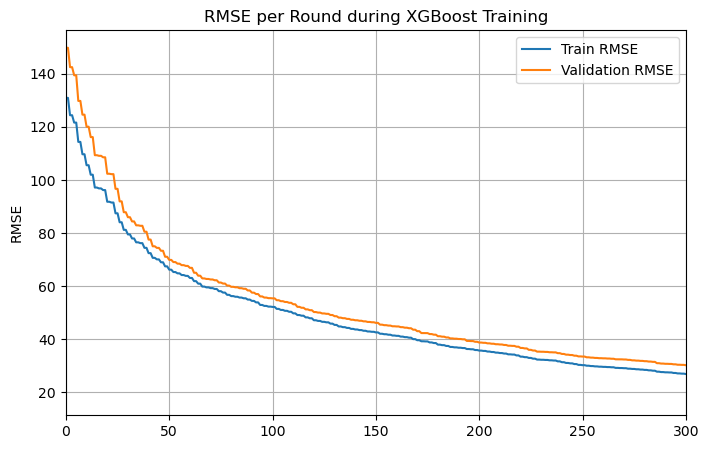

In [67]:
model_xg2, eval_results2, rmse2, y_pred_xg2 = train_xgboost_model(X_train2, y_train2, X_val2, y_val2, 300)

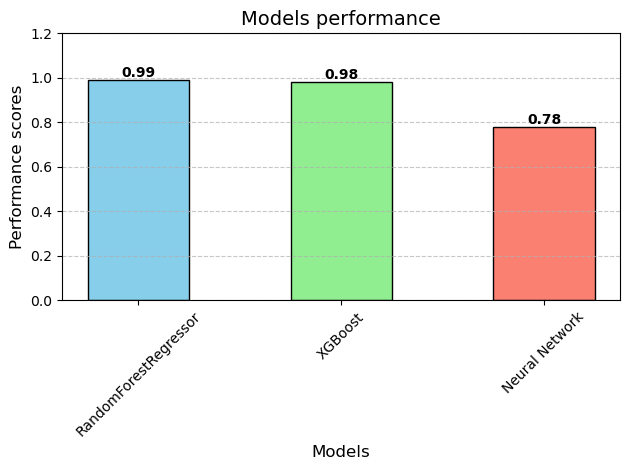

In [68]:
mod2 = pd.DataFrame({'RandomForestRegressor':0.988,
                    'XGBoost': 0.981,
                    'Neural Network': 0.780
    
}, index=np.arange(1))


bars2 = plt.bar(dict(mod2.iloc[0]).keys(), dict(mod2.iloc[0]).values(), width=0.5, color=['skyblue', 'lightgreen', 'salmon', 'gold'], edgecolor='black')

# Adding data labels on top of each bar
for bar in bars2:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), round(bar.get_height(), 2), ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.ylim(0, 1.2)  # Setting y-axis limits from 0 to 1 for better visualization of performance scores
plt.xlabel('Models', fontsize=12)
plt.ylabel('Performance scores', fontsize=12)
plt.title('Models performance', fontsize=14)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

## Check top 5 important features

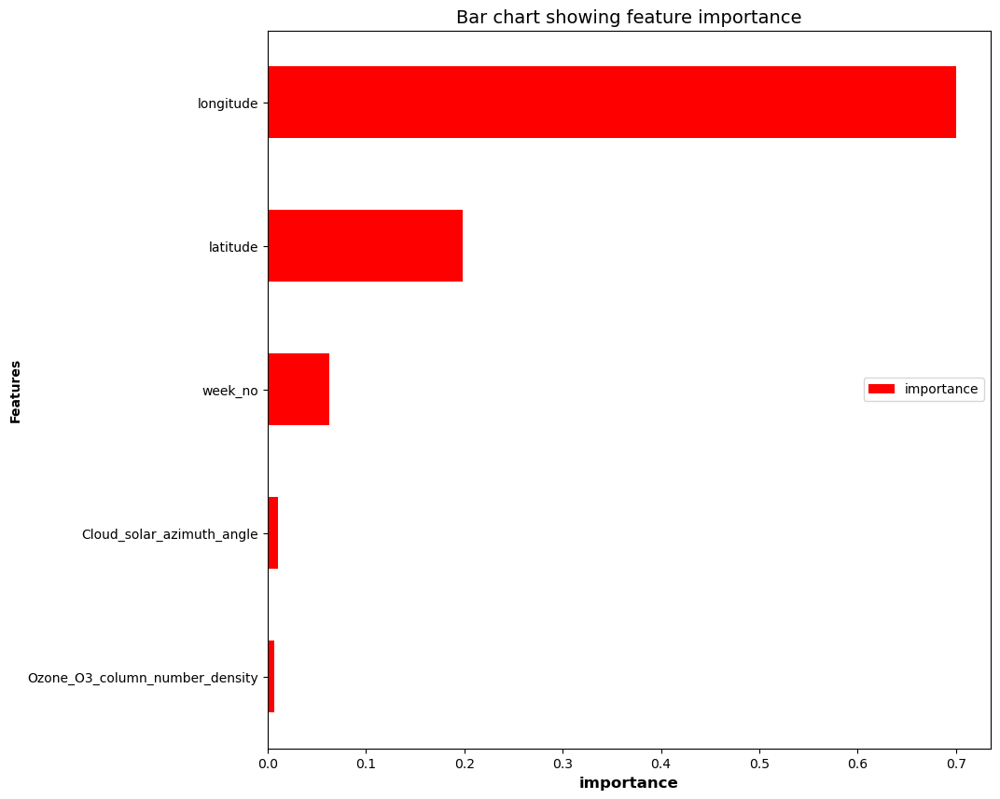

In [69]:
impo_df = pd.DataFrame({'feature': new_train.columns, 'importance': model_rf2.feature_importances_}).set_index('feature').sort_values(by = 'importance', ascending = False)
impo_df_t10 = impo_df[:5].sort_values(by = 'importance', ascending = True)
impo_df_t10.plot(kind = 'barh', figsize = (10, 10), color='red')
plt.legend(loc = 'center right')
plt.title('Bar chart showing feature importance', fontsize = 14)
plt.xlabel('importance', fontsize = 12, fontweight='bold')
plt.ylabel('Features', fontweight='bold')
plt.show()

Build models with the top 5 features

In [70]:
new_train2 = new_train[impo_df.index[:5]]

X_train3, X_val3, y_train3, y_val3 = train_test_split(new_train2, train_data['emission'], test_size=0.2, random_state=1212)

RandomForestRegressor

In [71]:
model_rf3 = RandomForestRegressor().fit(X_train3, y_train3)
y_pred_rf3 = model_rf3.predict(X_val3)
r2_score(y_val3, y_pred_rf3)

0.9837436184626994

Neural network

Epoch 1/100
1425/1431 [============================>.] - ETA: 0s - loss: 17513.6445
Epoch 1: val_loss improved from inf to 17318.83594, saving model to best_model.h5
1431/1431 [==============================] - 13s 9ms/step - loss: 17480.9062 - val_loss: 17318.8359 - lr: 0.0100
Epoch 2/100
1429/1431 [============================>.] - ETA: 0s - loss: 16197.1367
Epoch 2: val_loss did not improve from 17318.83594
1431/1431 [==============================] - 12s 8ms/step - loss: 16280.2676 - val_loss: 18283.1016 - lr: 0.0100
Epoch 3/100
1429/1431 [============================>.] - ETA: 0s - loss: 15792.9756
Epoch 3: val_loss improved from 17318.83594 to 16617.18359, saving model to best_model.h5
1431/1431 [==============================] - 12s 8ms/step - loss: 15790.3955 - val_loss: 16617.1836 - lr: 0.0100
Epoch 4/100
1426/1431 [============================>.] - ETA: 0s - loss: 15391.5342
Epoch 4: val_loss improved from 16617.18359 to 16453.65039, saving model to best_model.h5
1431/1431 [=

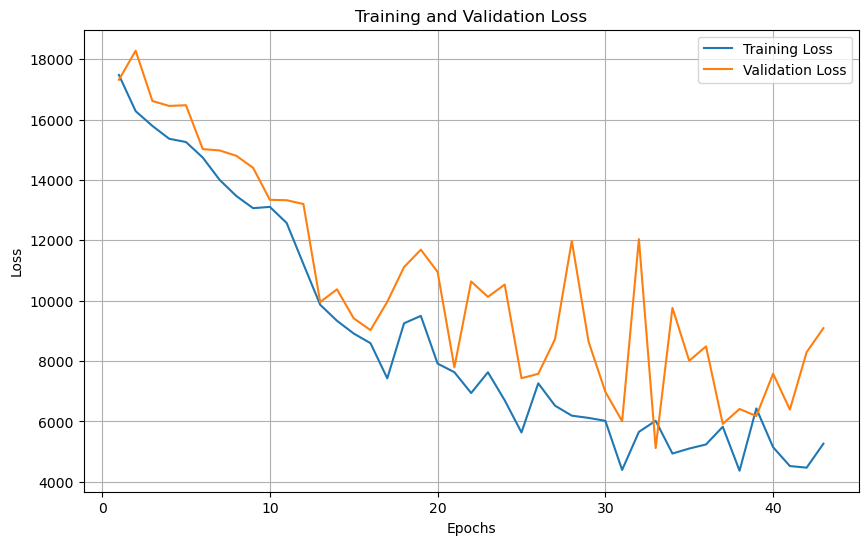

In [72]:
model_nn3, history3 = create_regression_model(X_train3, y_train3, X_val3, y_val3, 100, 0.01)

XGBoost

[0]	Train-rmse:131.12131	Validation-rmse:135.72615
[1]	Train-rmse:124.49438	Validation-rmse:130.97214
[2]	Train-rmse:116.86625	Validation-rmse:122.46094
[3]	Train-rmse:110.33244	Validation-rmse:115.24995
[4]	Train-rmse:104.81879	Validation-rmse:109.28685
[5]	Train-rmse:103.24599	Validation-rmse:108.03759
[6]	Train-rmse:99.22863	Validation-rmse:105.03548
[7]	Train-rmse:95.97938	Validation-rmse:102.70177
[8]	Train-rmse:93.08474	Validation-rmse:100.55627
[9]	Train-rmse:92.48472	Validation-rmse:100.06460
[10]	Train-rmse:90.06610	Validation-rmse:98.29248
[11]	Train-rmse:89.52096	Validation-rmse:97.84090
[12]	Train-rmse:86.24010	Validation-rmse:94.53422
[13]	Train-rmse:84.25146	Validation-rmse:92.97214
[14]	Train-rmse:82.76699	Validation-rmse:91.73843
[15]	Train-rmse:79.55055	Validation-rmse:87.19022
[16]	Train-rmse:77.80352	Validation-rmse:85.22006
[17]	Train-rmse:77.09283	Validation-rmse:84.57738
[18]	Train-rmse:74.90012	Validation-rmse:82.35366
[19]	Train-rmse:72.65147	Validation-rmse:78.

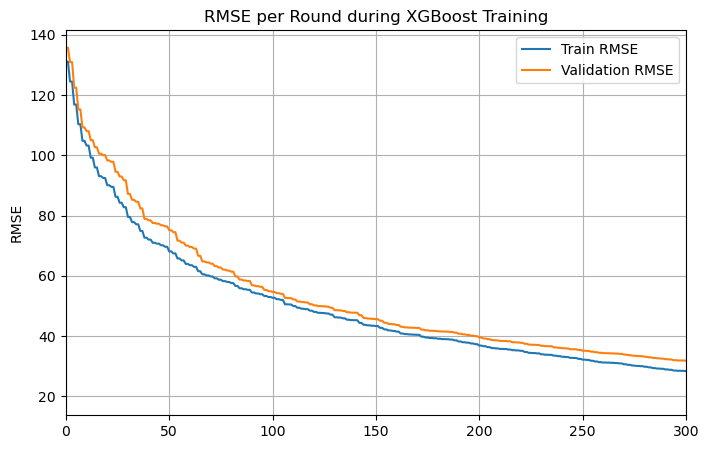

In [73]:
model_xg3, eval_results3, rmse3, y_pred_xg3 = train_xgboost_model(X_train3, y_train3, X_val3, y_val3, 300)

Visualize model performance with top 5 features

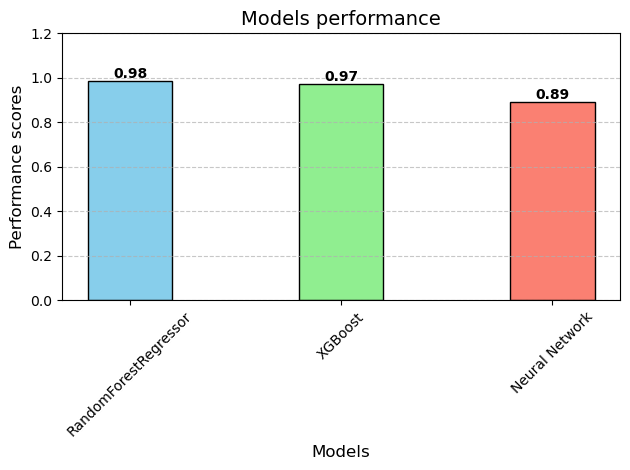

In [74]:
mod2 = pd.DataFrame({
              'RandomForestRegressor':0.984,
                    'XGBoost': 0.971,
                    'Neural Network': 0.89
    
}, index=np.arange(1))


bars2 = plt.bar(dict(mod2.iloc[0]).keys(), dict(mod2.iloc[0]).values(), width=0.4, color=['skyblue', 'lightgreen', 'salmon', 'gold'], edgecolor='black')

# Adding data labels on top of each bar
for bar in bars2:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), round(bar.get_height(), 2), ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.ylim(0, 1.2)  # Setting y-axis limits from 0 to 1 for better visualization of performance scores
plt.xlabel('Models', fontsize=12)
plt.ylabel('Performance scores', fontsize=12)
plt.title('Models performance', fontsize=14)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

##  EMISSION PREDICTION ON THE TEST DATASET

In [75]:
test_data = pd.read_csv('test.csv')

In [76]:
test_data_copy = test_data.copy()

In [77]:
test_data_copy.shape

(24353, 75)

In [78]:
test_data_copy.describe()

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,...,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle
count,24353.000000,24353.000000,24353.0,24353.000000,18211.000000,18211.000000,18211.000000,18211.000000,18211.000000,18211.000000,...,24187.000000,24187.000000,24187.000000,24187.000000,24187.000000,24187.000000,24187.000000,24187.000000,24187.000000,24187.000000
mean,-1.891072,29.880155,2022.0,24.000000,0.000014,0.792570,0.000009,0.139218,9.298052,36.174307,...,52291.369823,5850.560884,58914.750636,4876.144989,18.219421,0.256019,-15.910583,40.078944,-82.411205,27.984961
std,0.694532,0.810387,0.0,14.142426,0.000234,0.168043,0.000170,0.079865,67.148199,14.156478,...,8474.312135,1385.456558,9137.478850,1363.987819,12.276853,0.046614,31.296817,6.289530,35.684048,4.446146
min,-3.299000,28.228000,2022.0,0.000000,-0.000977,0.339845,-0.000775,0.000000,-106.809900,0.099606,...,22968.371094,1748.440552,26601.015625,1108.339359,1.758491,0.015563,-106.794670,0.181503,-148.381015,14.451874
25%,-2.451000,29.262000,2022.0,12.000000,-0.000122,0.678384,-0.000094,0.078934,-41.627297,26.577654,...,46443.513511,4891.547765,52564.911002,3919.961568,10.090358,0.229489,-35.621207,35.431041,-119.069505,24.359645
50%,-1.882000,29.883000,2022.0,24.000000,0.000007,0.763307,0.000004,0.138999,16.857963,37.310447,...,52026.814647,5813.010892,58725.298896,4828.621533,14.748459,0.257279,-12.945370,41.097947,-75.828261,28.389770
75%,-1.303000,30.471000,2022.0,36.000000,0.000137,0.872586,0.000104,0.200819,73.664560,45.972595,...,57814.509397,6780.095125,64998.470002,5793.453767,22.200969,0.287632,4.320550,44.186126,-46.573705,31.624962
max,-0.510000,31.532000,2022.0,48.000000,0.004110,1.696826,0.002701,0.299973,157.503026,66.243271,...,83092.004251,11840.539740,88543.121457,10840.539720,123.585268,0.507783,81.252467,65.118706,-22.295398,39.770470


In [79]:
test_data_copy.head().T

,0,1,2,3,4
ID_LAT_LON_YEAR_WEEK,ID_-0.510_29.290_2022_00,ID_-0.510_29.290_2022_01,ID_-0.510_29.290_2022_02,ID_-0.510_29.290_2022_03,ID_-0.510_29.290_2022_04
latitude,-0.51,-0.51,-0.51,-0.51,-0.51
longitude,29.29,29.29,29.29,29.29,29.29
year,2022,2022,2022,2022,2022
week_no,0,1,2,3,4
...,...,...,...,...,...
Cloud_surface_albedo,0.240773,0.293119,0.26713,0.304679,0.284221
Cloud_sensor_azimuth_angle,-100.113792,-30.510319,39.087361,-24.465127,-12.90785
Cloud_sensor_zenith_angle,33.697044,42.402593,45.93648,42.140419,30.122641
Cloud_solar_azimuth_angle,-133.047546,-138.632822,-144.784988,-135.027891,-135.500119


In [80]:
test_data.shape, train_data.shape

((24353, 75), (57209, 68))

Extract columns used for training the first set of models with all features

In [81]:
cols = [col for col in test_data.columns if col not in train_data.columns]

In [82]:
cols

['ID_LAT_LON_YEAR_WEEK',
 'UvAerosolLayerHeight_aerosol_height',
 'UvAerosolLayerHeight_aerosol_pressure',
 'UvAerosolLayerHeight_aerosol_optical_depth',
 'UvAerosolLayerHeight_sensor_zenith_angle',
 'UvAerosolLayerHeight_sensor_azimuth_angle',
 'UvAerosolLayerHeight_solar_azimuth_angle',
 'UvAerosolLayerHeight_solar_zenith_angle']

In [83]:
test_data.drop(cols[1:], axis=1, inplace=True)

In [84]:
test_data.shape, train_data.shape

((24353, 68), (57209, 68))

Visualize missing data

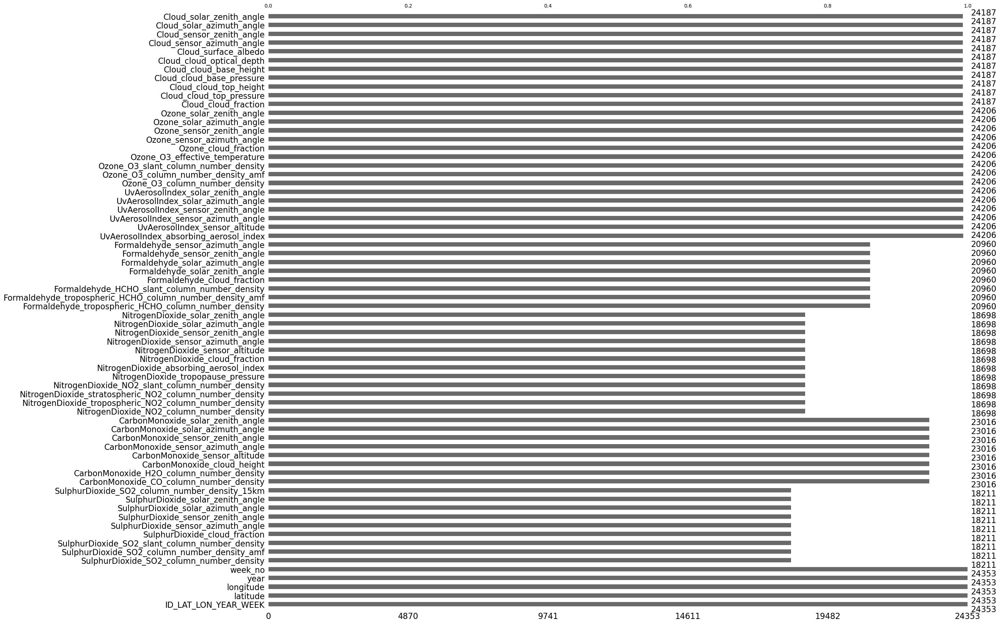

In [85]:
msno.bar(test_data);

Drop missing data

In [86]:
test_data = test_data.dropna()

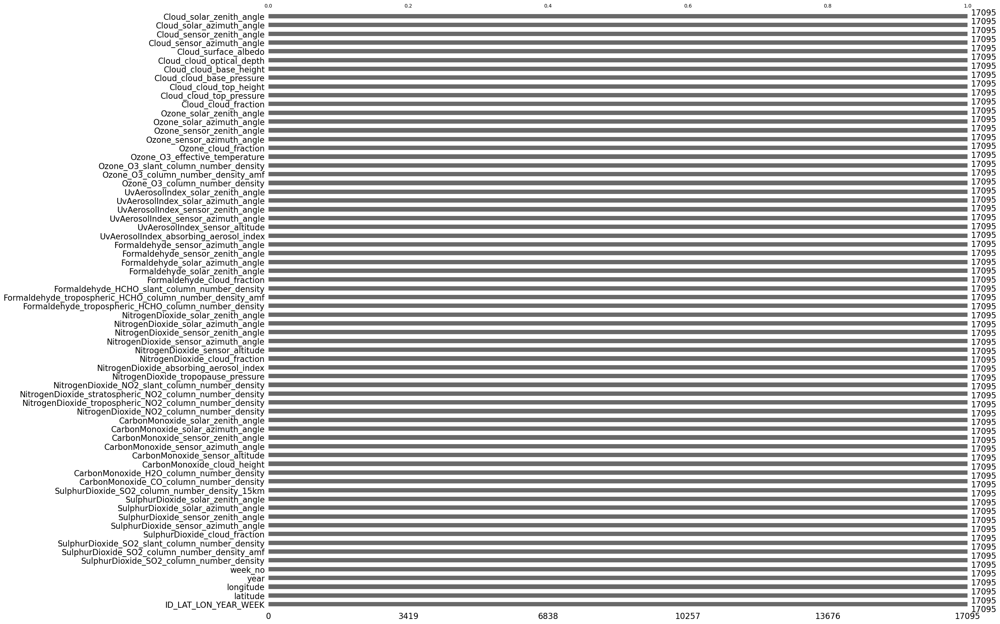

In [87]:
msno.bar(test_data);

## Using RandomForestRegressor to predict emission on the test dataset and compare the prediction with emission of 2019, 2020, and 2021

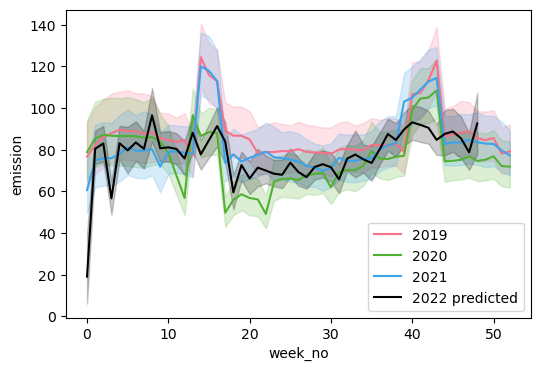

In [88]:
pred_df_scaled_all = pd.DataFrame({test_data.columns[0]: test_data['ID_LAT_LON_YEAR_WEEK'],
              'Predicted Emission': model_rf.predict(StandardScaler().fit_transform(test_data.drop('ID_LAT_LON_YEAR_WEEK', axis=1))),
                           'week': test_data['week_no']
    
})

palette = sb.color_palette("husl", len(train_data_copy['year'].unique()))
fig, ax = plt.subplots(figsize=(6,4))
sb.lineplot(data=train_data_copy, x = 'week_no', 
            y = 'emission',
            hue='year',
           palette = palette);

sb.lineplot(data=pred_df_scaled_all, x ='week', 
            y = 'Predicted Emission',
           palette = palette, color='k', label='2022 predicted');

plt.legend();

## EXTRACT THE FIVE FEATURES USED TO TRAIN THE LAST MODEL

In [89]:
cols2 = [col for col in test_data.columns if col not in new_train2.columns]
test_data2 = test_data.drop(cols2, axis=1)

In [90]:
test_data2.head(5)

,latitude,longitude,week_no,Ozone_O3_column_number_density,Cloud_solar_azimuth_angle
1,-0.51,29.29,1,0.112643,-138.632822
2,-0.51,29.29,2,0.112113,-144.784988
3,-0.51,29.29,3,0.111779,-135.027891
5,-0.51,29.29,5,0.112771,-136.151685
6,-0.51,29.29,6,0.113588,-124.991802


In [91]:
X_train

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,...,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle
8692,1.177552,2.023405,0.018830,1.712029,-0.479686,0.411010,-0.503279,-1.391308,-0.052150,-0.585524,...,-0.150010,0.048071,-0.064432,-0.018933,-0.791591,0.748935,1.312000,0.595771,-1.575687,0.241987
3581,1.497336,0.931164,0.018830,1.305099,-0.694495,1.362755,-0.920177,-1.557873,1.336505,0.153029,...,0.908210,-0.772267,1.005650,-0.846647,0.513968,0.159541,-0.622392,0.270247,-1.083414,0.886104
52884,-1.426199,-0.762745,0.018830,0.898169,-0.699834,-0.520321,-0.699399,1.252933,-0.066593,0.790002,...,-0.296389,0.235363,-0.226414,0.178125,-0.347317,-1.262071,-0.449488,0.780535,-0.179007,-0.376412
15832,0.788127,1.806205,1.242947,-0.797373,-0.950472,0.737338,-1.174657,-0.183403,-1.428824,1.093859,...,-1.356385,1.342386,-1.383874,1.347176,-0.625278,-0.336387,-1.257666,-0.529105,0.379778,-0.524997
3197,1.549923,1.975971,0.018830,-0.254800,-0.115742,0.741851,0.046511,-0.509949,-0.063035,-0.306364,...,1.049644,-0.805053,1.035741,-0.808123,-0.832504,0.205118,-0.614677,0.125708,1.102518,1.347650
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54343,-1.525687,0.148496,-1.205287,-0.526087,0.174070,3.284842,0.500607,0.213473,-0.999793,-0.835077,...,2.053180,-1.738470,1.832147,-1.588576,-0.431409,1.468018,-2.023276,-1.309478,0.902934,0.963769
38158,-0.542174,-0.235973,1.242947,-1.679055,-0.830245,-0.424599,-0.819482,0.280651,0.392910,-0.131721,...,-0.676245,0.838739,-0.646728,0.821218,-0.936164,0.909252,-0.473059,0.021475,-1.452620,0.291606
860,1.821384,1.215771,0.018830,-0.797373,1.796104,1.685693,3.061021,0.252244,-0.069468,-0.138239,...,0.767598,-0.572335,0.557075,-0.434054,3.057432,0.265370,0.850050,-0.989743,0.540298,-1.585047
15795,0.788127,1.806205,0.018830,-1.136482,0.064963,1.156299,0.051031,1.049623,0.421203,0.125986,...,0.750384,-0.548887,0.681683,-0.505607,-0.546963,-0.126019,-0.621964,-1.376032,-0.531668,-1.539604


## RandomForest with five features prediction

In [92]:
pred_df_scaled = pd.DataFrame({test_data.columns[0]: test_data['ID_LAT_LON_YEAR_WEEK'],
              'Predicted Emission': model_rf3.predict(StandardScaler().fit_transform(test_data2)),
                           'week': test_data['week_no']
    
})

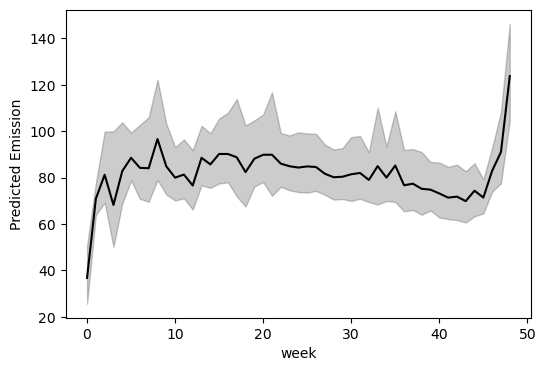

In [93]:
palette = sb.color_palette("husl", len(test_data_copy['year'].unique()))
fig, ax = plt.subplots(figsize=(6,4))
# sb.lineplot(data=pred_df, x ='week', 
#             y = 'Predicted Emission',
#             hue='year',
#            palette = palette)

sb.lineplot(data=pred_df_scaled, x ='week', 
            y = 'Predicted Emission',
           palette = palette, color='k');

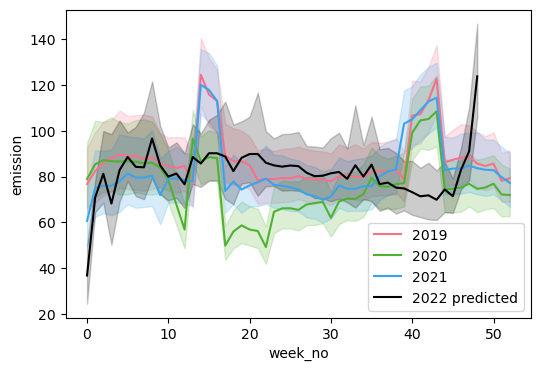

In [94]:
palette = sb.color_palette("husl", len(train_data_copy['year'].unique()))
fig, ax = plt.subplots(figsize=(6,4))
sb.lineplot(data=train_data_copy, x ='week_no', 
            y = 'emission',
            hue='year',
           palette = palette);

sb.lineplot(data=pred_df_scaled, x ='week', 
            y = 'Predicted Emission',
           palette = palette, color='k', label='2022 predicted');

plt.legend();

# Final Project Report


## Objectives:
The primary objective of this project was to develop predictive models for estimating future emissions in Rwanda, specifically 2022, leveraging machine learning techniques. The goal was to explore various regression algorithms and identify the most effective model for accurately predicting 2022 emissions based on features collected from 2019 to 2021. This involved comprehensive data analysis, feature selection, and model evaluation to achieve high predictive accuracy while optimizing computational efficiency.

## Background:
The project centered on a Kaggle competition titled "Emission Prediction in Rwanda," intended as a class project. The dataset comprised numerous features related to emissions, energy consumption, and environmental factors, with data spanning locations like farmlands, cities, power plants. Initially, exploratory data analysis (EDA) was conducted to comprehend the data distribution, identify missing values, and understand feature correlations. Subsequently, preprocessing steps were applied, including dropping columns with excessive missing data (> 70,000 missing values) and scaling features for uniformity. The dataset was split into training and validation sets, with 25% reserved for validation purposes.

## Methodology:
The methodology involved employing multiple regression algorithms such as XGBoost, RandomForestRegressor, Ridge Regression, SGDRegressor, SVM, and Neural Network to predict emissions. Initially, models were trained using all 75 features, revealing RandomForestRegressor and XGBoost as the top-performing models with 98% and 95% accuracy, respectively. However, feature importance analysis indicated that only a subset of features significantly contributed to predictions, highlighting strong multicollinearity among the variables.

To address multicollinearity and enhance model performance, subsequent iterations involved training models using reduced feature sets (10 and 5 features). Surprisingly, while Neural Network witnessed a remarkable increase in accuracy from 19% to 89% with the reduced feature set, RandomForestRegressor and XGBoost maintained high accuracy performances of 98% and 97%, respectively. The final model selected for predicting emissions on the test dataset was RandomForestRegressor due to its consistent high accuracy.

## Results:
The feature importance analysis revealed that only a few variables were influential in predicting emissions, indicating a need for feature selection. The RandomForestRegressor and XGBoost models performed exceptionally well with the full feature set, showcasing high accuracies. However, reducing the feature space to 10 and 5 features led to an surge in accuracy for the Neural Network while maintaining high performance for RandomForestRegressor and XGBoost.
Upon deploying the RandomForestRegressor model on the test dataset, it demonstrated robust predictive power, showcasing its reliability in estimating emissions in the context of Rwanda.

## Conclusion:
In conclusion, this project successfully explored multiple ML regression algorithms to predict emissions in Rwanda. Through comprehensive feature analysis and model comparison, it was discovered that RandomForestRegressor and XGBoost excelled in accuracy using the full feature set. However, by strategically reducing the feature space, particularly to 10 and 5 significant features, an increase in accuracy was observed for the Neural Network. RandomForestRegressor emerged as the chosen model for predicting emissions in the test dataset due to its consistent high performance. This study highlights the importance of feature selection and model optimization in improving predictive capabilities while maintaining computational efficiency.


## THANK YOU!!